# The Dual-Class Arbitrage Strategy: an Algorithmic Approach

This project is an attempt to automate and optimize the returns made from the Dual-Process Arbitrage Strategy as highlighted by these two articles - 

1) https://quant-galore.medium.com/there-is-a-huge-inefficiency-in-the-stock-market-567e13030cdf


2) https://medium.com/the-financial-journal/dual-class-arbitrage-is-a-literal-cash-cow-101c89d377cb

## Goals/Motivation

What I aim to do - 

1) Web-scrape a variety of companies with two separate classes, for example (Alphabet Inc Class A: GOOGL and Alphabet Inc Class C: GOOG) using some finance-related python APIs.

2) Employ the strategy highlighted - Short the alternative class stock (Usually undervalued class stock) and buy shares of the main class stock One with voter rights and/or higher executive/founder ownership).

3) Graph relationships and retain key financial information 

    a) Possibly create profit/loss charts across different companies' dual-class premiums (Difference between main
        and alternative prices)
        
    b) Identify if there is a certain threshold (spread between main and alternative prices which maximizes profit
        or minimizes loss)
        
4) Overall, this is just an idea to see if this market inefficiency can be at all leveraged to generate a profit utilizing an automated/computer driven approach.

# Here We Go...

## Import Packages

In [987]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas_datareader import data as pdr
from scipy.interpolate import interp1d
import pylab
import statsmodels.api as sm
import yfinance as yf
from datetime import date, timedelta, datetime
from dateutil.relativedelta import relativedelta
import plotly.graph_objs as go 
yf.pdr_override() 

## Functions

In [988]:
def ytd_premium_movement(main, alt):
    # Load data from both regions
    one_data = yf.download(main,start=last_year(), end=today())
    two_data = yf.download(alt,start=last_year(), end=today())
    
    # Main Trendline
    data1 = one_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Alt Trendline
    data2 = two_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Plot Premium Trendline 
    premium_table = (one_data - two_data)
    ### del premium_table['Volume']
    premium = premium_table.loc[:,"Adj Close"].copy()
    premium.plot(figsize=(20,7), fontsize = 16, color='y')
    plt.style.use("seaborn")
    plt.show()
    print(premium_table)
    

In [989]:
def gen_ytd_premium_movement(main, alt, start_date, end_date):
    # Load data from both regions
    one_data = yf.download(main,start=start_date, end=end_date)
    two_data = yf.download(alt,start=start_date, end=end_date)
    
    # Main Trendline
    data1 = one_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Alt Trendline
    data2 = two_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Plot Premium Trendline 
    premium_table = (one_data - two_data)
    ### del premium_table['Volume']
    premium = premium_table.loc[:,"Adj Close"].copy()
    premium.plot(figsize=(20,7), fontsize = 16, color='y')
    plt.style.use("seaborn")
    plt.show()
    print(premium_table)
    

In [990]:
def create_premium_table(main, alt):
    # Load data from both regions
    one_data = yf.download(main,start=last_year(), end=today())
    two_data = yf.download(alt,start=last_year(), end=today())
    
    # Main Trendline
    data1 = one_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Alt Trendline
    data2 = two_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Plot Premium Trendline 
    premium_table = (one_data - two_data)
    return premium_table

In [991]:
def get_Adj_close_premium(main, alt, start_date, end_date):
    # Load data from both regions
    one_data = yf.download(main,start=start_date, end=end_date)
    two_data = yf.download(alt,start=start_date, end=end_date)
    
    # Main Trendline
    data1 = one_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Alt Trendline
    data2 = two_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Plot Premium Trendline 
    premium_table = (one_data - two_data)
    return premium_table.loc[:,"Adj Close"].copy()[-1]

In [992]:
#Get Input layer parameters (AKA - RSS, slope and intercept)
def input_layer(main, alt):
    # Load data from both regions
    one_data = yf.download(main,start=last_year(), end=today())
    two_data = yf.download(alt,start=last_year(), end=today())
    
    # Main Trendline
    data1 = one_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Alt Trendline
    data2 = two_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Create Premium Table
    premium_table = (one_data - two_data)
    
    
    ###BUILD THE INPUT LAYER
    
    premium_table_copy = premium_table
    premium_table_copy['Date'] = premium_table_copy.index
    x = premium_table_copy['Date']
    y = premium_table_copy['Adj Close'].astype(float)

    # Create a sequance of integers from 0 to x.size to use in np.polyfit() call
    x_seq = np.arange(x.size) # should give you [ 0  1  2  3  4 ... 26]

    # call numpy polyfit() method with x_seq, y 
    fit = np.polyfit(x_seq, y, 1)
    fit_fn = np.poly1d(fit)
    coefs, residual, _, _, _ = np.polyfit(x_seq, y, 1, full=True)

    #Create input_layer in format [RSS, Slope, Intercept]
    input_layer = []
    input_layer.append(residual[0])
    input_layer.append(coefs[0])
    input_layer.append(coefs[1])
    return input_layer

In [993]:
#Get Input layer parameters (AKA - RSS, slope and intercept)
def gen_input_layer(main, alt, start_date, end_date):
    # Load data from both regions
    one_data = yf.download(main,start=start_date, end=end_date)
    two_data = yf.download(alt,start=start_date, end=end_date)
    
    # Main Trendline
    data1 = one_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Alt Trendline
    data2 = two_data.loc[:,"Adj Close"].copy()
    #data1.plot(figsize=(20,7), fontsize = 16)
    #plt.style.use("seaborn")
    
    # Create Premium Table
    premium_table = (one_data - two_data)
    
    
    ###BUILD THE INPUT LAYER
    
    premium_table_copy = premium_table
    premium_table_copy['Date'] = premium_table_copy.index
    x = premium_table_copy['Date']
    y = premium_table_copy['Adj Close'].astype(float)

    # Create a sequance of integers from 0 to x.size to use in np.polyfit() call
    x_seq = np.arange(x.size) # should give you [ 0  1  2  3  4 ... 26]

    # call numpy polyfit() method with x_seq, y 
    fit = np.polyfit(x_seq, y, 1)
    fit_fn = np.poly1d(fit)
    coefs, residual, _, _, _ = np.polyfit(x_seq, y, 1, full=True)

    #Create input_layer in format [RSS, Slope, Intercept]
    input_layer = []
    input_layer.append(residual[0])
    input_layer.append(coefs[0])
    input_layer.append(coefs[1])
    return input_layer

In [994]:
def ytd_stock_movement(stock):
    # Load data from region
    one_data = yf.download(stock,start=last_year(), end=today())
    
    # Main Trendline
    data1 = one_data.loc[:,"Adj Close"].copy()
    data1.plot(figsize=(20,7), fontsize = 16)
    plt.style.use("seaborn")
    plt.show()
    print(data1)

In [995]:
def intraweek_premium_movement(main, alt):
    df1 = yf.download(tickers=main,period='7d',interval='1m')
    df2 = yf.download(tickers=alt,period='7d',interval='1m')
    
    df = (df1 - df2)
    
    fig=go.Figure()
    fig.add_trace(go.Candlestick(x=df.index,
                    open=df['Open'],
                    high=df['High'],
                    low=df['Low'],
                    close=df['Close'], name = 'market data'))

    fig.update_layout(
        title= str(main)+' Live Share Price:',
        yaxis_title='Stock Price Difference (USD per Shares)')               

    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=15, label="15m", step="minute", stepmode="backward"),
                dict(count=45, label="45m", step="minute", stepmode="backward"),
                dict(count=1, label="1 Hour", step="hour", stepmode="todate"),
                dict(count=1440, label="1 Day", step="minute", stepmode="backward"),
                dict(step="all")
            ])
        )
    )

    fig.show()
    print(df)

In [996]:
#Get Today's Date
def today():
    today = date.today()
    today = today.strftime("%Y-%m-%d")
    return today

def last_year():
    last_year = datetime.now() - relativedelta(years=1)
    last_year = last_year.strftime("%Y-%m-%d")
    return last_year


In [997]:
def sigmoid(x):
    return 1/(1+exp(-x))

## Visualizations with an Example

We will call the main stock "one" and the alternative "two." We will also be looking at the two classes of Alphabet - Alphabet Inc Class A with ticker (GOOGL) and Alphabet Inc Class C with ticker (GOOG).

In [998]:
#The Two Classes
one = ['GOOGL']
two = ['GOOG']

In [999]:
intraweek_premium_movement(one, two)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


                         Open      High       Low     Close  Adj Close  Volume
Datetime                                                                      
2022-12-21 09:30:00 -0.650002 -0.549995 -0.580002 -0.514999  -0.514999  240386
2022-12-21 09:31:00 -0.529999 -0.544998 -0.559998 -0.540001  -0.540001   86441
2022-12-21 09:32:00 -0.539993 -0.539993 -0.559898 -0.570000  -0.570000   18203
2022-12-21 09:33:00 -0.599998 -0.570000 -0.580002 -0.574997  -0.574997   67435
2022-12-21 09:34:00 -0.590004 -0.589996 -0.610001 -0.579994  -0.579994   44852
...                       ...       ...       ...       ...        ...     ...
2022-12-30 15:56:00 -0.500000 -0.500000 -0.494995 -0.495003  -0.495003   -6111
2022-12-30 15:57:00 -0.500000 -0.509995 -0.490005 -0.505005  -0.505005  -98133
2022-12-30 15:58:00 -0.509995 -0.519997 -0.510002 -0.519997  -0.519997  124319
2022-12-30 15:59:00 -0.534996 -0.529999 -0.530006 -0.520004  -0.520004   51658
2022-12-30 16:00:00 -0.500000 -0.500000 -0.500000 -0

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


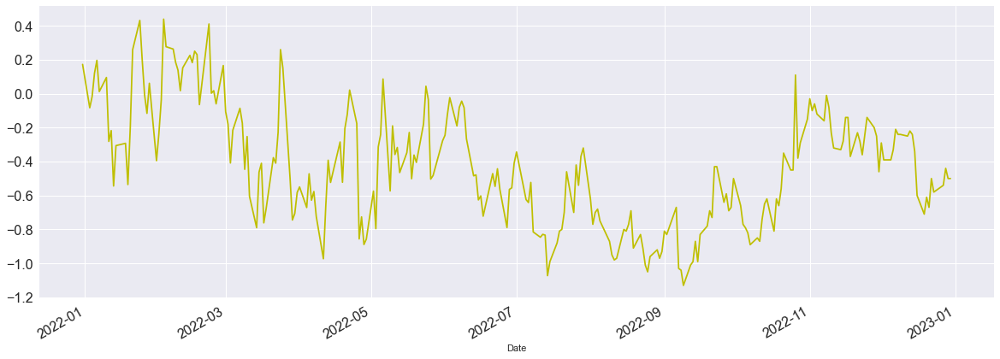

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2021-12-31  0.505997  0.333496  0.174500  0.172501   0.172501   838000
2022-01-03  0.579498  0.300995  0.210495 -0.082993  -0.082993  3432000
2022-01-04 -0.154510 -0.125000 -0.099640 -0.016998  -0.016998  5472000
2022-01-05  0.238998  0.201492  0.164505  0.121490   0.121490  4976000
2022-01-06 -0.498993  0.253998 -0.205002  0.196503   0.196503  8298000
...              ...       ...       ...       ...        ...      ...
2022-12-23 -0.510002 -0.549995 -0.550003 -0.579994  -0.579994  5184400
2022-12-27 -0.509995 -0.559998 -0.525002 -0.540001  -0.540001  4626400
2022-12-28 -0.519997 -0.479996 -0.430000 -0.440002  -0.440002  1643600
2022-12-29 -0.409996 -0.514999 -0.379997 -0.500000  -0.500000  5052800
2022-12-30 -0.384995 -0.529999 -0.459999 -0.500000  -0.500000  4785600

[252 rows x 6 columns]


In [1000]:
ytd_premium_movement(one, two)

## Observations

We notice the premium goes negative in instances where volatility is higher thereby making high liquidity necessary, but as shown, the premium has been negative (or much lower) for the entire latter-half of the year, thereby allowing us to possibly find that the high volatility inducing liquidity may enable us to make bets in favor of the main-class stocks (AKA the ones with voter rights), because in the end the market must return to normal with the move towards the end of recession decreasing fear of bad performance thereby decreasing the need for high liquidity and instead focus on the voter rights again.

We know that in general we may say voter rights tend to increase in the following order: c -> a -> b. The thing to notice here however, is that the shares held by key founders are not public, therefore we will not be play a position with those shares. However, the existence of the other two aka class a and c may be played with and would be the key players within this approach.

The intuition for a possible statistical method to quantify the worth of investing in the correct overall company may be as follows:

- A premium trendline that is deep under the waters (Currently stockholders value high liquidity over voter rights) with a higher RSS (Residual Sum of Squares)-(higher volatility) for the most part may be indicative of a company that may start trending upwards as it emerges out of the recession because the high volatility may push the need for liquidity lower thereby decreasing the demand for the highly liquid class c stocks working in our favor. **Need someone to check me here.**




- In order to correct the difference (At least in a short term time-span), there may be the necessity of a certain movement which we may use to our advantage to place the trade - aka class A share price will start to increase while class c would decrease.





- We may be able to run a perceptron with a dual input covering the volatility of premium graph and slope or intercept of premium graph, and/or possibly others and utilize an activation function to fire a binary response: Run the strategy or not on a given stock, and utilize a decent number or epochs to train the model on past recessions such as the 2008 Crash. Then, this model may be able to predict which stocks can offer high returns in the current/future recessions.





- We may be able to further automate an algorithmic predictor of the number of shares to buy/amount to short utilizing a stochastic gradient descent approach: this may be utilized in the future.


#### The Trade....

Buy the Class A share and short the Class C share (AKA short the share that holds no voting rights while buying the one that holds voter rights). (I probably won't short the stock because... undefined risk.

This trade would be made by identifying the dual class company with the (smallest RSS + deepest line).

Let the games begin....

## Gather Dual-Class Stock Information

Now, in order to make this process the most efficient, we may only look at top companies within reputable indexes, or else we will be trading with dead fish or outliers that may not follow the general trend of this research.

We will proceed with dual-class stocks within the VTI index as it is one of the largest American indexes and consists of atleast somewhat reliable stocks.

Given that there is not a relevant explicit list off which to scrape companies' tickers and prices, we may use regex - a popular nlp library's functionality to aid in our collection of data. I aim to create two separate pandas dataframes  for each class and proceed from there. 

In [1001]:
import re
from datapackage import Package

In [1002]:
# Initialize the arrays
main_class = pd.array([])
alt_class = pd.array([])

In [1003]:
# Gather Dual-Stocks within the VTI stored locally
vti_data = pd.read_csv('/Users/mihirsavkar/Downloads/vti-etf-holdings.csv')
vti_data = vti_data.dropna()

In [1004]:
#The following output is the list of all Dual-Class stocks within the VTI index (One of the largest)
'''For now, we aim to devise a strategy to only select stocks within this list - 
    we may make further changes such as adding stocks from other indexes as well such as VGT or international
    indexes.
'''

#Regex not needed as built in pandas functionality + pattern observation achieves desired outcome
useful_vti_data = vti_data[vti_data.duplicated('Name', keep=False) == True]
useful_vti_data

,No.,Symbol,Name,"<span class=""hidden sm:inline"">%</span> Weight",Shares
3,4,GOOGL,Alphabet Inc.,1.50%,"180,691,255"
4,5,BRK.B,Berkshire Hathaway Inc.,1.32%,"50,667,318"
5,6,GOOG,Alphabet Inc.,1.31%,"157,950,146"
320,321,BF.B,Brown-Forman Corporation,0.06%,"9,324,784"
339,340,LEN,Lennar Corporation,0.05%,"7,148,854"
394,395,BRK.A,Berkshire Hathaway Inc.,0.04%,"1,051"
473,474,HEI.A,HEICO Corporation,0.03%,"3,024,042"
504,505,LBRDK,Liberty Broadband Corporation,0.03%,"3,773,686"
557,558,FOXA,Fox Corporation,0.02%,"8,849,921"
587,588,NWSA,News Corporation,0.02%,"13,768,692"


In [1005]:
#Organize the data
dual_class_pairs= {}
for i in range(len(useful_vti_data)):
    if useful_vti_data.iloc[i][2] not in dual_class_pairs:
        classes = []
        dual_class_pairs[useful_vti_data.iloc[i][2]] = classes   
for i in range(len(useful_vti_data)):
    dual_class_pairs[useful_vti_data.iloc[i][2]].append([useful_vti_data.iloc[i][1].replace(".",'-').replace("$",'')])   

In [1006]:
dual_class_pairs

{'Alphabet Inc.': [['GOOGL'], ['GOOG']],
 'Berkshire Hathaway Inc.': [['BRK-B'], ['BRK-A']],
 'Brown-Forman Corporation': [['BF-B'], ['BF-A']],
 'Lennar Corporation': [['LEN'], ['LEN-B']],
 'HEICO Corporation': [['HEI-A'], ['HEI']],
 'Liberty Broadband Corporation': [['LBRDK'], ['LBRDA']],
 'Fox Corporation': [['FOXA'], ['FOX']],
 'News Corporation': [['NWSA'], ['NWS']],
 'Zillow Group, Inc.': [['Z'], ['ZG']],
 'Clearway Energy, Inc.': [['CWEN'], ['CWEN-A']],
 'Greif, Inc.': [['GEF'], ['GEF-B']],
 'Under Armour, Inc.': [['UA'], ['UAA']],
 'Central Garden & Pet Company': [['CENTA'], ['CENT']],
 'Federal Agricultural Mortgage Corporation': [['AGM'], ['AGM-A']],
 'Lions Gate Entertainment Corp.': [['LGF-B'], ['LGF-A']],
 'Bel Fuse Inc.': [['BELFB'], ['BELFA']],
 'Urstadt Biddle Properties Inc.': [['UBA'], ['UBP']],
 'Urban One, Inc.': [['UONEK'], ['UONE']],
 'Biglari Holdings Inc.': [['BH'], ['BH-A']],
 'FAT Brands Inc.': [['FAT'], ['FATBB']],
 'Tidewater Inc New ([Wts/Rts])': [['TDW-WS-A

In [1007]:
#Create Intraday Premium Movement charts/market-summaries for all dual-class shares in the VTI Index
for i in dual_class_pairs:
    intraweek_premium_movement(dual_class_pairs[i][0], dual_class_pairs[i][1])

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


                         Open      High       Low     Close  Adj Close  Volume
Datetime                                                                      
2022-12-21 09:30:00 -0.650002 -0.549995 -0.580002 -0.514999  -0.514999  240386
2022-12-21 09:31:00 -0.529999 -0.544998 -0.559998 -0.540001  -0.540001   86441
2022-12-21 09:32:00 -0.539993 -0.539993 -0.559898 -0.570000  -0.570000   18203
2022-12-21 09:33:00 -0.599998 -0.570000 -0.580002 -0.574997  -0.574997   67435
2022-12-21 09:34:00 -0.590004 -0.589996 -0.610001 -0.579994  -0.579994   44852
...                       ...       ...       ...       ...        ...     ...
2022-12-30 15:56:00 -0.500000 -0.500000 -0.494995 -0.495003  -0.495003   -6111
2022-12-30 15:57:00 -0.500000 -0.509995 -0.490005 -0.505005  -0.505005  -98133
2022-12-30 15:58:00 -0.509995 -0.519997 -0.510002 -0.519997  -0.519997  124319
2022-12-30 15:59:00 -0.534996 -0.529999 -0.530006 -0.520004  -0.520004   51658
2022-12-30 16:00:00 -0.500000 -0.500000 -0.500000 -0

                              Open           High            Low  \
Datetime                                                           
2022-12-21 09:30:00            NaN            NaN            NaN   
2022-12-21 09:31:00 -461497.619995 -461535.619995 -460547.119995   
2022-12-21 09:32:00            NaN            NaN            NaN   
2022-12-21 09:33:00            NaN            NaN            NaN   
2022-12-21 09:34:00 -459988.089996 -461748.630005 -459988.089996   
...                            ...            ...            ...   
2022-12-30 15:56:00 -467616.829987 -468072.137512 -467108.829987   
2022-12-30 15:57:00 -467294.290009 -467896.209991 -467116.410004   
2022-12-30 15:58:00 -467541.823761 -467547.708740 -467173.431244   
2022-12-30 15:59:00 -467438.744995 -467552.019989 -467278.549988   
2022-12-30 16:00:00 -468402.068756 -468402.068756 -468402.068756   

                             Close      Adj Close   Volume  
Datetime                                              

                         Open      High       Low     Close  Adj Close  \
Datetime                                                                 
2022-12-21 09:30:00  0.059998  0.059998  0.059998  0.059998   0.059998   
2022-12-21 09:33:00       NaN       NaN       NaN       NaN        NaN   
2022-12-21 09:34:00       NaN       NaN       NaN       NaN        NaN   
2022-12-21 09:35:00       NaN       NaN       NaN       NaN        NaN   
2022-12-21 09:36:00  0.284996  0.244995  0.175003  0.269997   0.269997   
...                       ...       ...       ...       ...        ...   
2022-12-30 15:56:00       NaN       NaN       NaN       NaN        NaN   
2022-12-30 15:57:00       NaN       NaN       NaN       NaN        NaN   
2022-12-30 15:58:00 -0.020004 -0.040001 -0.020004 -0.020004  -0.020004   
2022-12-30 15:59:00  0.030006 -0.050003  0.020004 -0.070000  -0.070000   
2022-12-30 16:00:00 -0.080002 -0.080002 -0.080002 -0.080002  -0.080002   

                      Volume  
Dateti

                          Open       High        Low      Close  Adj Close  \
Datetime                                                                     
2022-12-21 09:30:00  16.610001  16.959999  16.610001  16.845001  16.845001   
2022-12-21 09:31:00        NaN        NaN        NaN        NaN        NaN   
2022-12-21 09:32:00  16.370003  16.419998  16.370003  16.419998  16.419998   
2022-12-21 09:33:00  16.349998  16.349998  16.320000  16.329994  16.329994   
2022-12-21 09:34:00  16.419998  16.500000  16.290001  16.290001  16.290001   
...                        ...        ...        ...        ...        ...   
2022-12-30 15:56:00        NaN        NaN        NaN        NaN        NaN   
2022-12-30 15:57:00        NaN        NaN        NaN        NaN        NaN   
2022-12-30 15:58:00  15.550003  15.589996  15.540001  15.559998  15.559998   
2022-12-30 15:59:00  15.615005  15.639999  15.639999  15.709999  15.709999   
2022-12-30 16:00:00  15.720001  15.720001  15.720001  15.720001 

                          Open       High        Low      Close  Adj Close  \
Datetime                                                                     
2022-12-21 09:30:00 -35.079994 -34.464996 -35.079994 -34.464996 -34.464996   
2022-12-21 09:31:00        NaN        NaN        NaN        NaN        NaN   
2022-12-21 09:32:00        NaN        NaN        NaN        NaN        NaN   
2022-12-21 09:33:00 -33.459991 -33.590004 -33.459991 -33.590004 -33.590004   
2022-12-21 09:34:00 -33.320000 -33.320000 -33.760002 -33.760002 -33.760002   
...                        ...        ...        ...        ...        ...   
2022-12-30 15:56:00 -33.850006 -33.919998 -33.870003 -33.915001 -33.915001   
2022-12-30 15:57:00 -33.880005 -33.769997 -33.899994 -33.769997 -33.769997   
2022-12-30 15:58:00 -33.729996 -33.850006 -33.709999 -33.850006 -33.850006   
2022-12-30 15:59:00 -33.774994 -33.809998 -33.699989 -33.809998 -33.809998   
2022-12-30 16:00:00 -33.790001 -33.790001 -33.790001 -33.790001 

                         Open      High       Low     Close  Adj Close  \
Datetime                                                                 
2022-12-21 09:30:00  0.950005  2.180000  0.989998  0.910004   0.910004   
2022-12-21 09:31:00  0.750000  0.785004  0.550003  0.655006   0.655006   
2022-12-21 09:32:00  0.964996  1.300003  0.964996  1.320000   1.320000   
2022-12-21 09:33:00       NaN       NaN       NaN       NaN        NaN   
2022-12-21 09:34:00       NaN       NaN       NaN       NaN        NaN   
...                       ...       ...       ...       ...        ...   
2022-12-30 15:56:00       NaN       NaN       NaN       NaN        NaN   
2022-12-30 15:57:00  0.419998  0.419998  0.369995  0.409996   0.409996   
2022-12-30 15:58:00  0.409996  0.400002  0.419998  0.390007   0.390007   
2022-12-30 15:59:00  0.349998  0.389999  0.430000  0.379997   0.379997   
2022-12-30 16:00:00  0.419998  0.419998  0.419998  0.419998   0.419998   

                      Volume  
Dateti

                         Open      High       Low     Close  Adj Close  \
Datetime                                                                 
2022-12-21 09:30:00  1.930000  1.940001  1.925001  1.925001   1.925001   
2022-12-21 09:31:00  1.897499  1.910000  1.850000  1.885000   1.885000   
2022-12-21 09:32:00  1.904999  1.902500  1.875000  1.870001   1.870001   
2022-12-21 09:33:00  1.850000  1.860001  1.820000  1.830000   1.830000   
2022-12-21 09:34:00  1.820000  1.850000  1.820000  1.830000   1.830000   
...                       ...       ...       ...       ...        ...   
2022-12-30 15:56:00  1.929998  1.935001  1.924999  1.940001   1.940001   
2022-12-30 15:57:00  1.945000  1.935001  1.924999  1.930000   1.930000   
2022-12-30 15:58:00  1.939999  1.930000  1.929998  1.934999   1.934999   
2022-12-30 15:59:00  1.924999  1.934999  1.925001  1.920000   1.920000   
2022-12-30 16:00:00  1.920000  1.920000  1.920000  1.920000   1.920000   

                      Volume  
Dateti

                         Open      High       Low     Close  Adj Close  \
Datetime                                                                 
2022-12-21 09:30:00 -0.280001 -0.250000 -0.220001 -0.210001  -0.210001   
2022-12-21 09:31:00 -0.219999 -0.230000 -0.240000 -0.200001  -0.200001   
2022-12-21 09:32:00 -0.219999 -0.199999 -0.219999 -0.209999  -0.209999   
2022-12-21 09:33:00 -0.240000 -0.235001 -0.240000 -0.230001  -0.230001   
2022-12-21 09:34:00 -0.230001 -0.230001 -0.230000 -0.230001  -0.230001   
...                       ...       ...       ...       ...        ...   
2022-12-30 15:56:00 -0.260000 -0.250000 -0.260000 -0.250000  -0.250000   
2022-12-30 15:57:00 -0.254999 -0.244999 -0.260000 -0.250000  -0.250000   
2022-12-30 15:58:00 -0.250000 -0.250801 -0.250000 -0.250000  -0.250000   
2022-12-30 15:59:00 -0.255001 -0.254999 -0.260000 -0.260000  -0.260000   
2022-12-30 16:00:00 -0.240000 -0.240000 -0.240000 -0.240000  -0.240000   

                      Volume  
Dateti

                         Open      High       Low     Close  Adj Close  \
Datetime                                                                 
2022-12-21 09:30:00  0.970001  0.970001  0.930000  0.845001   0.845001   
2022-12-21 09:31:00  0.985001  0.989998  0.919998  0.945000   0.945000   
2022-12-21 09:32:00       NaN       NaN       NaN       NaN        NaN   
2022-12-21 09:33:00       NaN       NaN       NaN       NaN        NaN   
2022-12-21 09:34:00  0.960999  0.989998  0.830002  0.799999   0.799999   
...                       ...       ...       ...       ...        ...   
2022-12-30 15:56:00  0.980000  0.985001  0.974998  0.975002   0.975002   
2022-12-30 15:57:00  0.990000  0.990000  0.976002  0.985001   0.985001   
2022-12-30 15:58:00  0.994999  0.994999  0.980001  0.980000   0.980000   
2022-12-30 15:59:00  0.985001  0.990002  0.970001  0.980000   0.980000   
2022-12-30 16:00:00  1.000000  1.000000  1.000000  1.000000   1.000000   

                      Volume  
Dateti

                         Open      High       Low     Close  Adj Close  \
Datetime                                                                 
2022-12-21 09:30:00  2.160002  2.150002  2.010000  2.000000   2.000000   
2022-12-21 09:31:00       NaN       NaN       NaN       NaN        NaN   
2022-12-21 09:32:00  2.199999  2.199999  2.120001  2.120001   2.120001   
2022-12-21 09:33:00       NaN       NaN       NaN       NaN        NaN   
2022-12-21 09:34:00       NaN       NaN       NaN       NaN        NaN   
...                       ...       ...       ...       ...        ...   
2022-12-30 15:56:00  1.930000  1.965000  1.939999  1.949999   1.949999   
2022-12-30 15:57:00  1.959999  1.950001  1.939999  1.932501   1.932501   
2022-12-30 15:58:00  1.945000  1.945000  1.920000  1.920000   1.920000   
2022-12-30 15:59:00  1.910000  1.939999  1.920000  1.969999   1.969999   
2022-12-30 16:00:00  1.950001  1.950001  1.950001  1.950001   1.950001   

                      Volume  
Dateti

                          Open       High        Low      Close  Adj Close  \
Datetime                                                                     
2022-12-21 09:30:00  -7.809998  -7.809998  -7.809998  -7.809998  -7.809998   
2022-12-21 09:32:00        NaN        NaN        NaN        NaN        NaN   
2022-12-21 09:48:00        NaN        NaN        NaN        NaN        NaN   
2022-12-21 09:49:00        NaN        NaN        NaN        NaN        NaN   
2022-12-21 09:50:00        NaN        NaN        NaN        NaN        NaN   
...                        ...        ...        ...        ...        ...   
2022-12-30 15:56:00        NaN        NaN        NaN        NaN        NaN   
2022-12-30 15:57:00        NaN        NaN        NaN        NaN        NaN   
2022-12-30 15:58:00 -11.009995 -11.009995 -11.129997 -11.129997 -11.129997   
2022-12-30 15:59:00 -11.125000 -11.010002 -11.150002 -11.010002 -11.010002   
2022-12-30 16:00:00 -11.170006 -11.170006 -11.170006 -11.170006 

                         Open      High       Low     Close  Adj Close  \
Datetime                                                                 
2022-12-21 09:30:00 -1.160000 -1.179999 -1.169999 -1.219999  -1.219999   
2022-12-21 09:31:00 -1.195001 -1.200000 -1.175000 -1.160000  -1.160000   
2022-12-21 09:32:00 -1.165000 -1.200000 -1.160000 -1.190000  -1.190000   
2022-12-21 09:33:00 -1.200000 -1.224999 -1.200001 -1.200001  -1.200001   
2022-12-21 09:34:00 -1.205000 -1.215000 -1.205000 -1.224999  -1.224999   
...                       ...       ...       ...       ...        ...   
2022-12-30 15:56:00 -1.225000 -1.220000 -1.220500 -1.225000  -1.225000   
2022-12-30 15:57:00 -1.230000 -1.230000 -1.220000 -1.225000  -1.225000   
2022-12-30 15:58:00 -1.223800 -1.230000 -1.220000 -1.225000  -1.225000   
2022-12-30 15:59:00 -1.225000 -1.220100 -1.230000 -1.226399  -1.226399   
2022-12-30 16:00:00 -1.240000 -1.240000 -1.240000 -1.240000  -1.240000   

                       Volume  
Datet

                         Open      High       Low     Close  Adj Close  Volume
Datetime                                                                      
2022-12-21 09:30:00 -1.440002 -1.440002 -1.440002 -1.440002  -1.440002     0.0
2022-12-21 09:36:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-21 09:37:00 -1.559998 -1.410000 -1.559998 -1.410000  -1.410000  1059.0
2022-12-21 09:38:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-21 09:44:00 -1.970001 -1.940002 -1.970001 -1.970001  -1.970001   437.0
...                       ...       ...       ...       ...        ...     ...
2022-12-30 15:56:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-30 15:57:00 -1.670002 -1.670002 -1.690002 -1.690002  -1.690002   630.0
2022-12-30 15:58:00 -1.680000 -1.680000 -1.650002 -1.639999  -1.639999  2018.0
2022-12-30 15:59:00 -1.595001 -1.615002 -1.660000 -1.650002  -1.650002  4062.0
2022-12-30 16:00:00 -1.650002 -1.650002 -1.650002 -1

                     Open  High  Low  Close  Adj Close  Volume
Datetime                                                      
2022-12-21 09:30:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:37:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:38:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:43:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:45:00   NaN   NaN  NaN    NaN        NaN     NaN
...                   ...   ...  ...    ...        ...     ...
2022-12-30 15:56:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:57:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:58:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:59:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 16:00:00   NaN   NaN  NaN    NaN        NaN     NaN

[630 rows x 6 columns]
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


                       Open    High     Low  Close  Adj Close   Volume
Datetime                                                              
2022-12-21 09:30:00 -0.2100 -0.2100 -0.2100 -0.210     -0.210 -14657.0
2022-12-21 09:31:00 -0.2400 -0.2986 -0.3000 -0.280     -0.280   -791.0
2022-12-21 09:32:00 -0.2900 -0.3050 -0.2900 -0.305     -0.305 -29699.0
2022-12-21 09:33:00 -0.3012 -0.3000 -0.3012 -0.300     -0.300  -8359.0
2022-12-21 09:34:00 -0.3000 -0.3000 -0.3000 -0.300     -0.300 -13494.0
...                     ...     ...     ...    ...        ...      ...
2022-12-30 15:56:00 -0.2650 -0.2700 -0.2800 -0.280     -0.280  17846.0
2022-12-30 15:57:00 -0.2800 -0.2900 -0.2813 -0.285     -0.285  -8723.0
2022-12-30 15:58:00 -0.2900 -0.2950 -0.2900 -0.295     -0.295   3007.0
2022-12-30 15:59:00 -0.2900 -0.2850 -0.2900 -0.280     -0.280    350.0
2022-12-30 16:00:00 -0.2800 -0.2800 -0.2800 -0.280     -0.280      0.0

[2636 rows x 6 columns]
[*********************100%***********************]  

                     Open  High  Low  Close  Adj Close  Volume
Datetime                                                      
2022-12-21 09:30:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:38:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:40:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:58:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 10:18:00   NaN   NaN  NaN    NaN        NaN     NaN
...                   ...   ...  ...    ...        ...     ...
2022-12-30 15:56:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:57:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:58:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:59:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 16:00:00   NaN   NaN  NaN    NaN        NaN     NaN

[533 rows x 6 columns]
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


                         Open      High       Low     Close  Adj Close  Volume
Datetime                                                                      
2022-12-21 09:30:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-21 09:38:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-21 09:40:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-21 09:41:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-21 09:54:00       NaN       NaN       NaN       NaN        NaN     NaN
...                       ...       ...       ...       ...        ...     ...
2022-12-30 15:56:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-30 15:57:00       NaN       NaN       NaN       NaN        NaN     NaN
2022-12-30 15:58:00  0.430000  0.430000  0.410000  0.410000   0.410000  3777.0
2022-12-30 15:59:00  0.650000  0.650000  0.620001  0.650000   0.650000  6655.0
2022-12-30 16:00:00  0.740002  0.740002  0.740002  0

                     Open  High   Low  Close  Adj Close  Volume
Datetime                                                       
2022-12-21 09:30:00   NaN   NaN   NaN    NaN        NaN     NaN
2022-12-21 09:31:00   NaN   NaN   NaN    NaN        NaN     NaN
2022-12-21 09:42:00   NaN   NaN   NaN    NaN        NaN     NaN
2022-12-21 10:14:00   NaN   NaN   NaN    NaN        NaN     NaN
2022-12-21 10:21:00   NaN   NaN   NaN    NaN        NaN     NaN
...                   ...   ...   ...    ...        ...     ...
2022-12-30 15:54:00 -0.84 -0.84 -0.84  -0.84      -0.84    -3.0
2022-12-30 15:55:00   NaN   NaN   NaN    NaN        NaN     NaN
2022-12-30 15:56:00   NaN   NaN   NaN    NaN        NaN     NaN
2022-12-30 15:59:00 -0.87 -0.86 -0.80  -0.79      -0.79  -531.0
2022-12-30 16:00:00 -0.79 -0.79 -0.79  -0.79      -0.79     0.0

[416 rows x 6 columns]
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


                           Open        High        Low       Close  \
Datetime                                                             
2022-12-21 09:30:00         NaN         NaN        NaN         NaN   
2022-12-21 10:18:00 -573.300018 -572.560013 -573.52002 -572.610016   
2022-12-21 10:19:00         NaN         NaN        NaN         NaN   
2022-12-21 10:21:00         NaN         NaN        NaN         NaN   
2022-12-21 10:47:00         NaN         NaN        NaN         NaN   
...                         ...         ...        ...         ...   
2022-12-30 15:56:00         NaN         NaN        NaN         NaN   
2022-12-30 15:57:00         NaN         NaN        NaN         NaN   
2022-12-30 15:58:00         NaN         NaN        NaN         NaN   
2022-12-30 15:59:00         NaN         NaN        NaN         NaN   
2022-12-30 16:00:00         NaN         NaN        NaN         NaN   

                      Adj Close  Volume  
Datetime                                 
2022-

                     Open  High  Low  Close  Adj Close  Volume
Datetime                                                      
2022-12-21 09:39:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:42:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:48:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 09:58:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-21 10:40:00   NaN   NaN  NaN    NaN        NaN     NaN
...                   ...   ...  ...    ...        ...     ...
2022-12-30 15:16:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:21:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:31:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:36:00   NaN   NaN  NaN    NaN        NaN     NaN
2022-12-30 15:48:00   NaN   NaN  NaN    NaN        NaN     NaN

[226 rows x 6 columns]
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- TDW-WS-A: No data found, symbol may be delisted
[*****************

Empty DataFrame
Columns: [Open, High, Low, Close, Adj Close, Volume]
Index: []


Alphabet Inc.
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


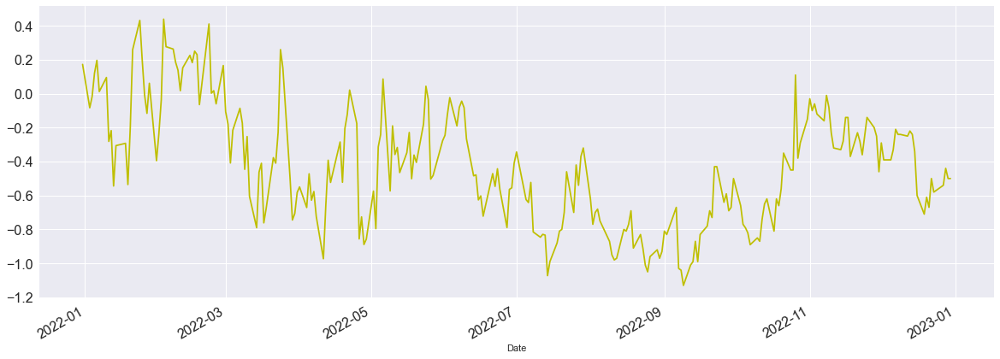

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2021-12-31  0.505997  0.333496  0.174500  0.172501   0.172501   838000
2022-01-03  0.579498  0.300995  0.210495 -0.082993  -0.082993  3432000
2022-01-04 -0.154510 -0.125000 -0.099640 -0.016998  -0.016998  5472000
2022-01-05  0.238998  0.201492  0.164505  0.121490   0.121490  4976000
2022-01-06 -0.498993  0.253998 -0.205002  0.196503   0.196503  8298000
...              ...       ...       ...       ...        ...      ...
2022-12-23 -0.510002 -0.549995 -0.550003 -0.579994  -0.579994  5184400
2022-12-27 -0.509995 -0.559998 -0.525002 -0.540001  -0.540001  4626400
2022-12-28 -0.519997 -0.479996 -0.430000 -0.440002  -0.440002  1643600
2022-12-29 -0.409996 -0.514999 -0.379997 -0.500000  -0.500000  5052800
2022-12-30 -0.384995 -0.529999 -0.459999 -0.500000  -0.500000  4785600

[252 rows x 6 columns]








Berkshire Hathaway Inc.
[********************

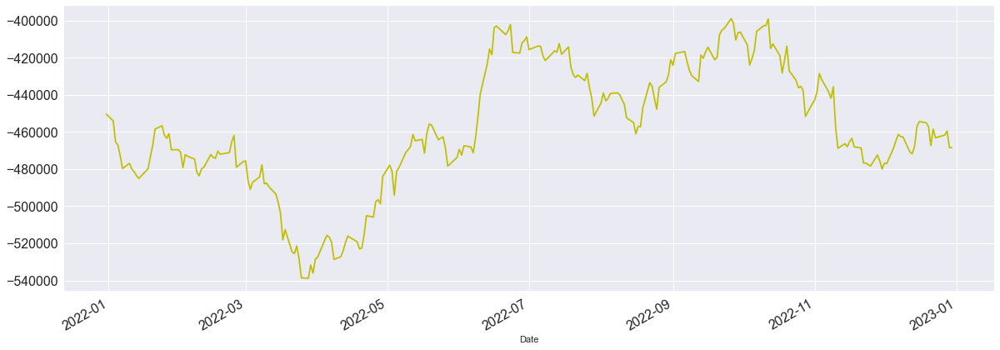

                     Open           High            Low          Close  \
Date                                                                     
2021-12-31 -449645.059998 -455609.309998 -449646.160004 -450363.000000   
2022-01-03 -451704.899994 -454498.700012 -450720.799988 -453999.209991   
2022-01-04 -458373.350006 -465885.790009 -452074.350006 -465416.470001   
2022-01-05 -468190.130005 -473866.519989 -465740.500000 -466964.079987   
2022-01-06 -470587.019989 -473229.890015 -466925.779999 -472839.779999   
...                   ...            ...            ...            ...   
2022-12-23 -458293.119995 -463203.429993 -455591.070007 -463093.510010   
2022-12-27 -475488.549988 -475846.420013 -460695.350006 -461649.450012   
2022-12-28 -464695.230011 -464927.540009 -444947.739990 -459496.570007   
2022-12-29 -462409.059998 -469690.619995 -460424.760010 -468415.940002   
2022-12-30 -469010.049988 -469007.959991 -462494.380005 -468402.100006   

                Adj Close   Volume  


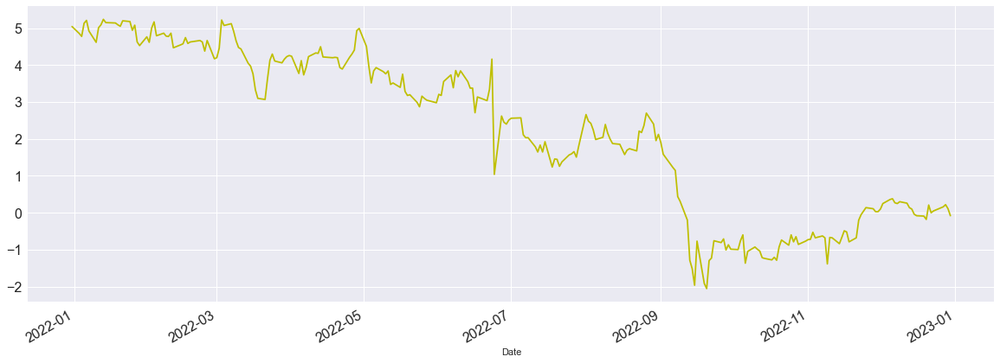

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2021-12-31  4.559998  5.029999  4.629997  5.070000   5.045120   632100
2022-01-03  4.739998  4.739998  4.839996  4.879997   4.856712  1222300
2022-01-04  5.079994  5.050003  4.799995  4.800003   4.777565   870400
2022-01-05  4.770004  5.090004  4.750000  5.159996   5.133652   896000
2022-01-06  5.369995  5.270004  5.149998  5.240002   5.211571  1404600
...              ...       ...       ...       ...        ...      ...
2022-12-23 -0.060005  0.029999  0.049995  0.049995   0.049995   564800
2022-12-27  0.329994  0.169998 -0.250000  0.160004   0.160004   533600
2022-12-28 -0.129997  0.199997  0.220001  0.220001   0.220001   570800
2022-12-29 -0.090004  0.120003 -0.070000  0.110001   0.110001   585900
2022-12-30 -0.080002  0.320000  0.019997 -0.080002  -0.080002   646200

[252 rows x 6 columns]








Lennar Corporation
[*********************100%

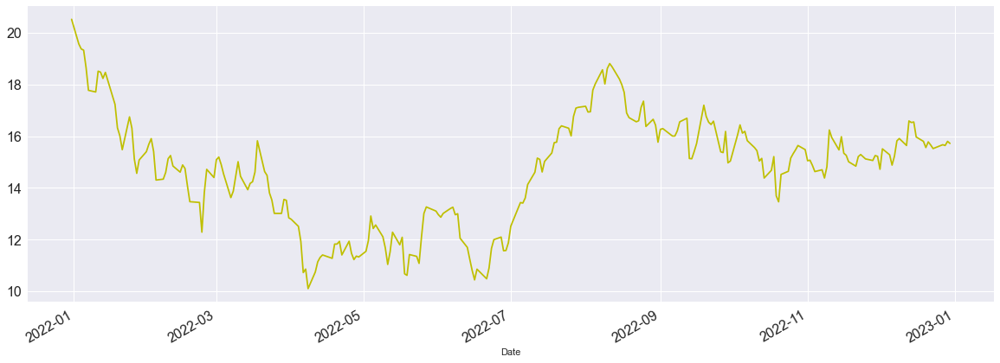

                 Open       High        Low      Close  Adj Close   Volume
Date                                                                      
2021-12-31  21.120003  20.630005  20.570000  20.540001  20.524277   815200
2022-01-03  19.419998  19.940002  19.880005  19.579994  19.569054  2354800
2022-01-04  19.430000  19.770004  19.570000  19.379997  19.376175  2061100
2022-01-05  18.979996  20.279999  19.050003  19.339996  19.330566  2739500
2022-01-06  18.660004  18.660004  18.129997  18.659996  18.655228  3036400
...               ...        ...        ...        ...        ...      ...
2022-12-23  15.309998  15.089996  15.060005  15.520004  15.520004   937500
2022-12-27  15.660004  15.739998  15.660004  15.669998  15.669998   980300
2022-12-28  15.310005  15.590004  15.720001  15.639999  15.639999  1124200
2022-12-29  15.699997  15.849998  15.209999  15.799995  15.799995  1269500
2022-12-30  15.660004  15.559998  15.660004  15.720001  15.720001  1015900

[252 rows x 6 columns]



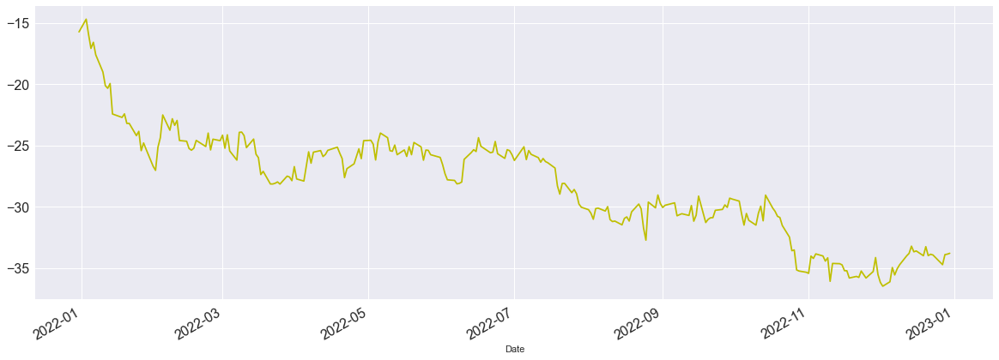

                 Open       High        Low      Close  Adj Close  Volume
Date                                                                     
2021-12-31 -16.070007 -15.149994 -15.979996 -15.699997 -15.710556  -20100
2022-01-03 -15.779999 -15.259995 -14.120003 -14.659988 -14.671967  -61100
2022-01-04 -14.910004 -15.740005 -14.910004 -15.910004 -15.921021 -167400
2022-01-05 -16.950012 -16.110001 -16.410004 -17.050003 -17.059814 -187200
2022-01-06 -17.000000 -15.989990 -17.149994 -16.550003 -16.560318 -157000
...               ...        ...        ...        ...        ...     ...
2022-12-23 -34.860008 -34.080009 -33.500008 -33.930000 -33.930000  -32100
2022-12-27 -33.730003 -34.830002 -34.070000 -34.720009 -34.720009  -16500
2022-12-28 -34.810005 -34.519997 -33.790001 -33.900002 -33.900002  -77400
2022-12-29 -34.230003 -34.459991 -34.220001 -33.860001 -33.860001  -81500
2022-12-30 -34.010002 -33.809998 -33.580002 -33.790001 -33.790001  -54300

[252 rows x 6 columns]








Libert

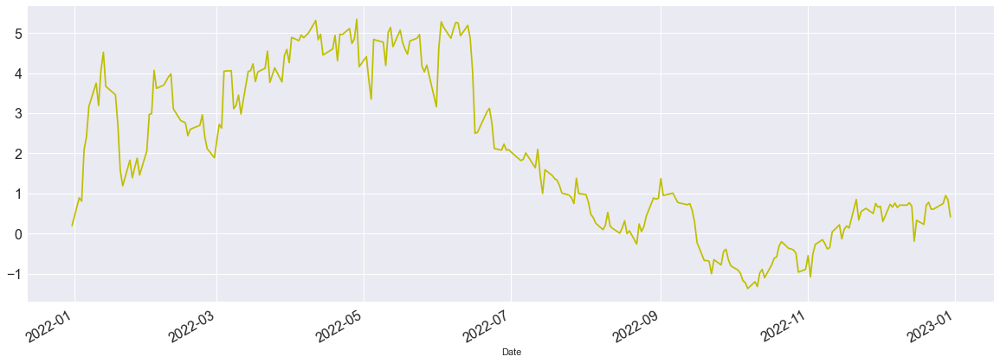

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2021-12-31  0.339996  0.320007  0.160004  0.200012   0.200012   664000
2022-01-03 -0.250000  0.899994  0.399994  0.889999   0.889999   348700
2022-01-04  0.240005  0.830002  0.880005  0.809998   0.809998   435700
2022-01-05  0.500000  1.240005  2.119995  2.090012   2.090012   382500
2022-01-06  2.440002  2.339996  2.250000  2.419998   2.419998   365600
...              ...       ...       ...       ...        ...      ...
2022-12-23  0.779999  0.550003  0.779999  0.610001   0.610001  1017700
2022-12-27  0.500000  0.724998  0.025002  0.750000   0.750000  1254700
2022-12-28  1.489998  0.769997  0.839996  0.950005   0.950005  1274900
2022-12-29  0.699997  0.985001  0.575005  0.840004   0.840004   759900
2022-12-30  1.119995  0.440002  0.860001  0.419998   0.419998   737200

[252 rows x 6 columns]








Fox Corporation
[*********************100%***

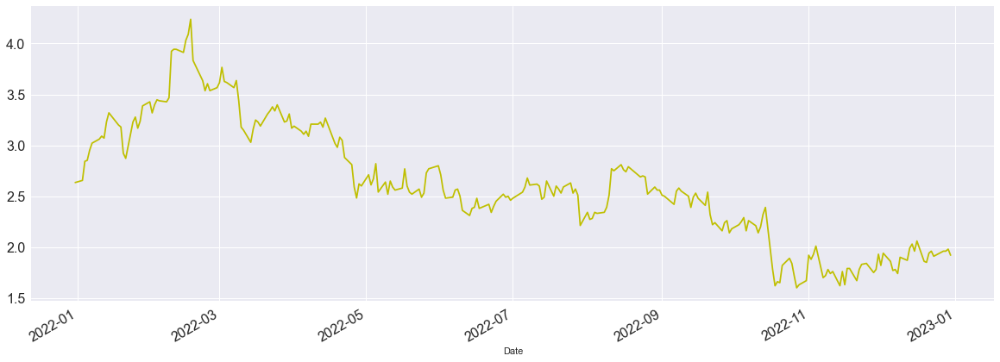

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2021-12-31  2.775002  2.790001  2.629997  2.630001   2.634323   836200
2022-01-03  2.660004  2.769997  2.439999  2.649998   2.654869  1816600
2022-01-04  2.690002  2.785000  2.660000  2.840000   2.842560  3424000
2022-01-05  3.090000  2.920002  2.840000  2.850002   2.852020   995900
2022-01-06  2.920002  2.869999  2.830002  2.950001   2.951530  1553900
...              ...       ...       ...       ...        ...      ...
2022-12-23  1.939999  1.950001  1.889999  1.910000   1.910000   854400
2022-12-27  2.010000  1.994999  1.930000  1.960001   1.960001   663800
2022-12-28  1.820002  1.960001  1.910000  1.960001   1.960001   920600
2022-12-29  2.040001  1.984999  1.960001  1.980000   1.980000   546000
2022-12-30  1.920000  1.990000  1.865000  1.920000   1.920000  1750600

[252 rows x 6 columns]








News Corporation
[*********************100%**

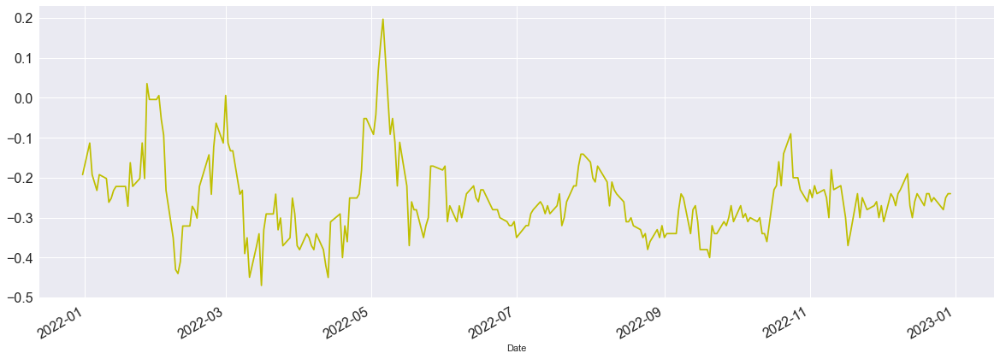

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2021-12-31 -0.350000 -0.250000 -0.160000 -0.190001  -0.192263  2287600
2022-01-03 -0.270000 -0.150002 -0.299999 -0.109999  -0.113161  2607900
2022-01-04 -0.090000 -0.139999 -0.189999 -0.190001  -0.192314  2310200
2022-01-05 -0.199999 -0.140001 -0.190001 -0.210001  -0.211967  3159500
2022-01-06  0.320000 -0.250000  0.270000 -0.230000  -0.231894  2548300
...              ...       ...       ...       ...        ...      ...
2022-12-23 -0.360001 -0.189999 -0.260000 -0.250000  -0.250000  3015400
2022-12-27 -0.220001 -0.210001 -0.250000 -0.279999  -0.279999  1097400
2022-12-28 -0.299999 -0.260000 -0.260000 -0.250000  -0.250000  1101600
2022-12-29 -0.240000 -0.240000 -0.280001 -0.240000  -0.240000   722800
2022-12-30 -0.260000 -0.250000 -0.269999 -0.240000  -0.240000  1389200

[252 rows x 6 columns]








Zillow Group, Inc.
[*********************100%

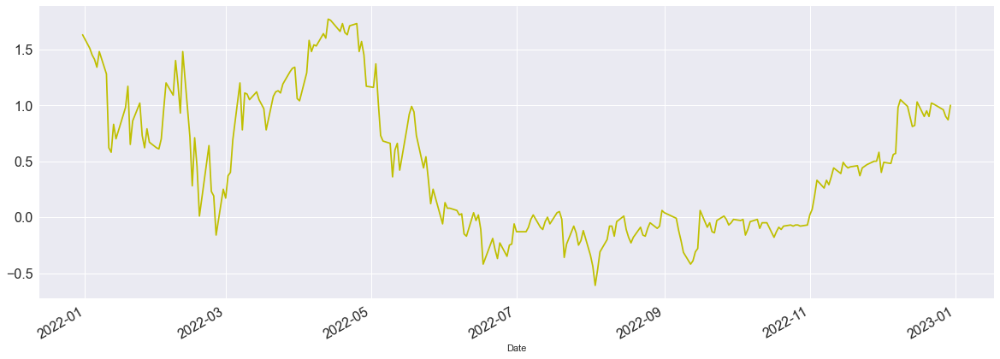

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2021-12-31  1.700001  1.659996  1.750000  1.629997   1.629997  2590400
2022-01-03  1.800003  1.679001  1.579998  1.509998   1.509998  2770600
2022-01-04  1.739998  1.549999  1.619999  1.450001   1.450001  3688500
2022-01-05  1.290001  1.599998  1.540001  1.410000   1.410000  3291200
2022-01-06  1.450001  1.389999  1.400002  1.340000   1.340000  4110000
...              ...       ...       ...       ...        ...      ...
2022-12-23  1.199997  1.009998  0.984999  1.010002   1.010002  1216400
2022-12-27  0.929998  0.930000  0.880001  0.959999   0.959999  1787100
2022-12-28  0.900000  1.030001  0.870001  0.900002   0.900002  2855400
2022-12-29  0.950001  0.889999  0.850000  0.869999   0.869999  2494500
2022-12-30  0.730000  0.980001  0.879999  1.000000   1.000000  2715000

[252 rows x 6 columns]








Clearway Energy, Inc.
[*********************1

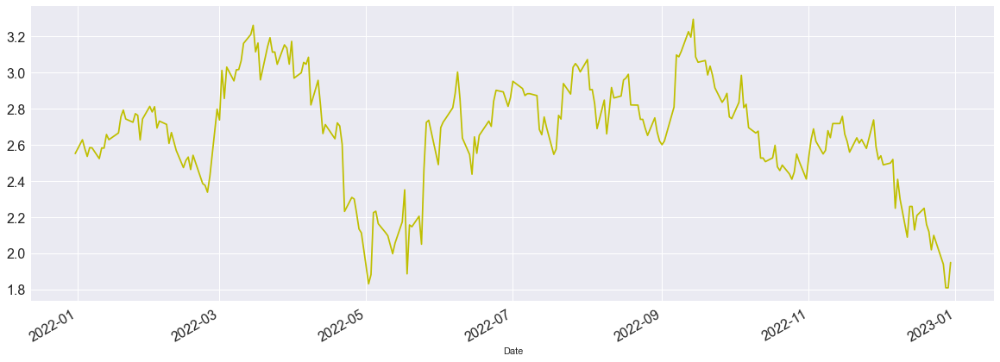

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
2021-12-31  2.379997  2.599998  2.405300  2.549999   2.552528  154878
2022-01-03  2.320000  2.630001  2.500000  2.629997   2.628887  184544
2022-01-04  2.690002  2.709999  2.630001  2.579998   2.579260  167008
2022-01-05  2.310001  2.660000  2.545000  2.540001   2.536575  295361
2022-01-06  2.610001  2.709999  2.560001  2.590000   2.585020  322189
...              ...       ...       ...       ...        ...     ...
2022-12-23  2.200001  2.029999  2.080000  2.100000   2.100000  326490
2022-12-27  2.189999  1.954998  2.037100  1.940001   1.940001  364244
2022-12-28  1.749998  1.839998  1.940001  1.809999   1.809999  277426
2022-12-29  1.940001  1.880001  1.839600  1.810001   1.810001  540271
2022-12-30  1.789999  1.879999  1.920000  1.950001   1.950001  326585

[252 rows x 6 columns]








Greif, Inc.
[*********************100%********************

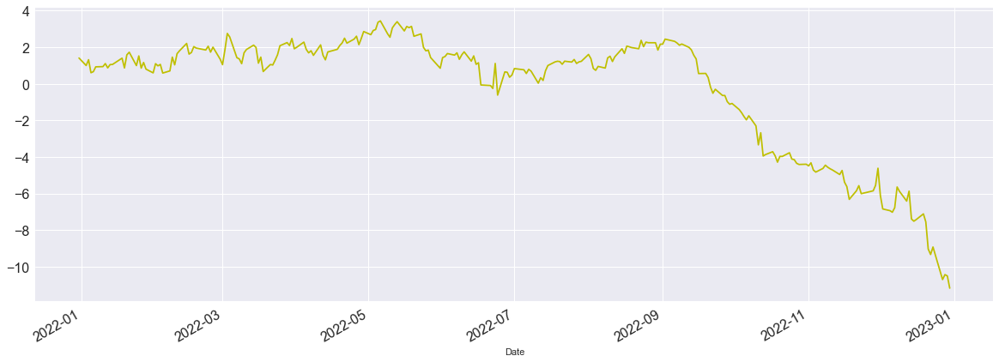

                 Open       High        Low      Close  Adj Close  Volume
Date                                                                     
2021-12-31  -0.099998   0.169998   0.399998   0.590000   1.408916  129100
2022-01-03   0.450001   0.350002   0.180000   0.169998   0.998360  112100
2022-01-04   0.570000   0.260002   0.320000   0.500000   1.317966  146500
2022-01-05   0.120003   0.219997  -0.360001  -0.250000   0.604866  117900
2022-01-06   0.939999   0.430000  -0.340000  -0.180000   0.664524  285400
...               ...        ...        ...        ...        ...     ...
2022-12-23  -9.190002  -9.130005  -9.379997  -8.919998  -8.919998  114800
2022-12-27  -9.480003 -10.419998  -9.609993 -10.699997 -10.699997   70300
2022-12-28 -10.940002 -10.820007 -10.419998 -10.430000 -10.430000  125100
2022-12-29 -11.099998 -11.049995 -11.250000 -10.500000 -10.500000  109200
2022-12-30 -11.380005 -11.029999 -11.019997 -11.170006 -11.170006  120900

[252 rows x 6 columns]








Under 

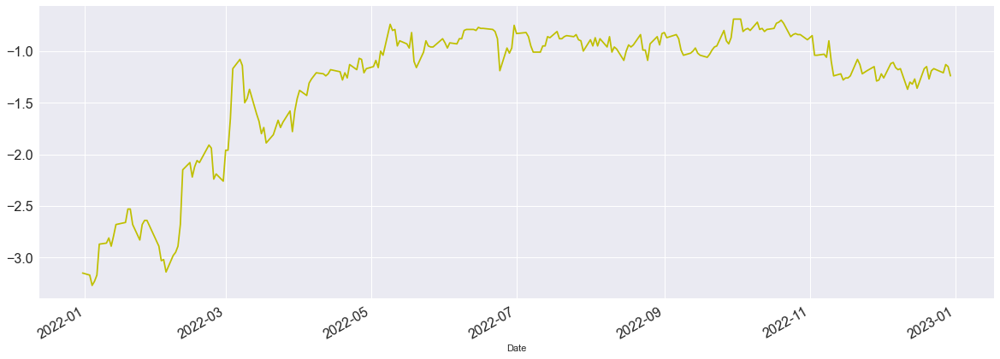

                Open      High       Low  Close  Adj Close   Volume
Date                                                               
2021-12-31 -3.080000 -3.145000 -3.020000  -3.15      -3.15 -2902749
2022-01-03 -3.240002 -3.270000 -3.154999  -3.17      -3.17 -2616513
2022-01-04 -3.410000 -3.360001 -3.120001  -3.27      -3.27 -3925482
2022-01-05 -3.210001 -3.262201 -3.220001  -3.23      -3.23 -1530220
2022-01-06 -3.090000 -3.199999 -3.000000  -3.17      -3.17 -2611419
...              ...       ...       ...    ...        ...      ...
2022-12-23 -1.150001 -1.170000 -1.170000  -1.17      -1.17 -3252310
2022-12-27 -1.170000 -1.200001 -1.130000  -1.21      -1.21 -3773645
2022-12-28 -1.160000 -1.190000 -1.150001  -1.13      -1.13 -3214169
2022-12-29 -1.179999 -1.179999 -1.170000  -1.15      -1.15 -4099272
2022-12-30 -1.110000 -1.215000 -1.120000  -1.24      -1.24 -3722816

[252 rows x 6 columns]








Central Garden & Pet Company
[*********************100%***********************]  1 o

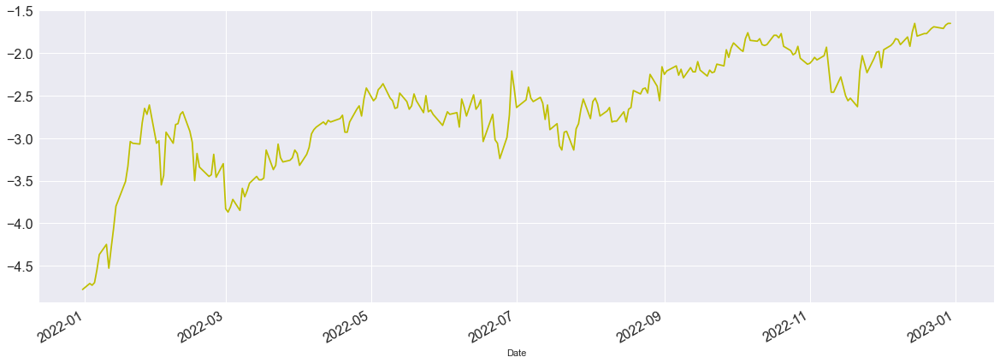

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
2021-12-31 -4.430000 -4.639999 -4.750000 -4.780003  -4.780003   55500
2022-01-03 -4.800003 -4.920002 -4.840000 -4.709999  -4.709999   99400
2022-01-04 -5.230003 -4.770000 -4.699997 -4.730000  -4.730000   98100
2022-01-05 -4.580002 -4.780003 -4.589996 -4.700001  -4.700001  168100
2022-01-06 -4.900002 -4.810001 -4.639999 -4.550003  -4.550003   75400
...              ...       ...       ...       ...        ...     ...
2022-12-23 -1.849998 -1.650002 -1.680000 -1.690002  -1.690002   88200
2022-12-27 -1.600002 -1.750000 -1.890003 -1.709999  -1.709999   81600
2022-12-28 -1.690002 -1.180000 -1.730000 -1.669998  -1.669998   94900
2022-12-29 -1.639999 -1.710003 -2.079998 -1.649998  -1.649998   85800
2022-12-30 -1.639999 -1.690002 -1.709999 -1.650002  -1.650002   98300

[252 rows x 6 columns]








Federal Agricultural Mortgage Corporation
[***************

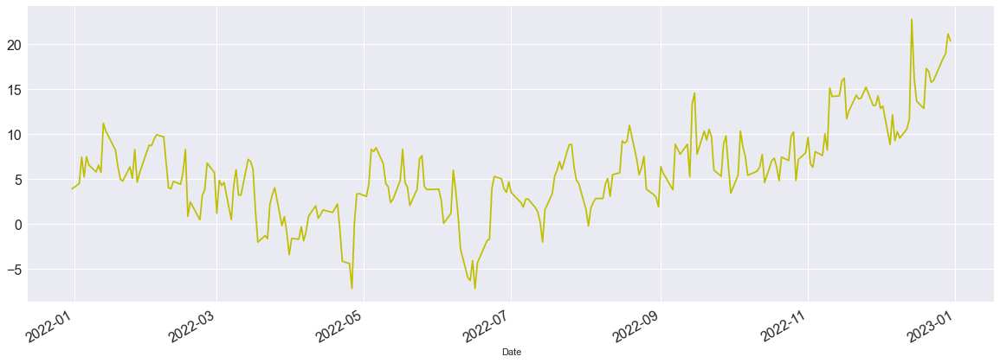

                 Open       High        Low      Close  Adj Close  Volume
Date                                                                     
2021-12-31   3.980003   4.070000   2.940002   3.930000   3.926109   16000
2022-01-03   5.660004   7.559998   3.190002   4.550003   4.524872   40200
2022-01-04   5.430000   8.750000   5.430000   7.580002   7.451118   32400
2022-01-05   7.300003   8.490005   5.070000   5.309998   5.258850   22400
2022-01-06   6.419998   8.529999   5.830002   7.639999   7.509064   24100
...               ...        ...        ...        ...        ...     ...
2022-12-23  16.579994  17.369995  14.919998  15.979996  15.979996   40300
2022-12-27  20.029999  20.540001  18.099998  18.459999  18.459999   43600
2022-12-28  19.080002  19.260002  18.959999  18.959999  18.959999   62000
2022-12-29  20.260002  22.120003  19.080002  21.169998  21.169998   46600
2022-12-30  20.680000  21.239998  19.800003  20.389999  20.389999   38900

[252 rows x 6 columns]








Lions 

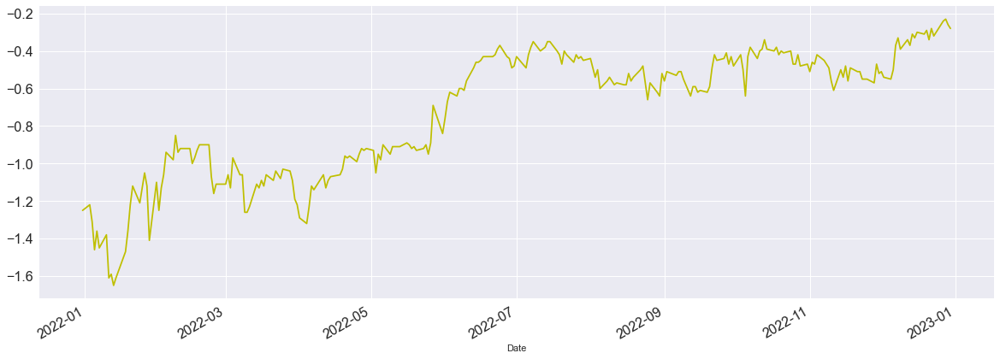

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2021-12-31 -1.040000 -1.245000 -1.059999 -1.249999  -1.249999    47100
2022-01-03 -1.120000 -1.290001 -1.195001 -1.219999  -1.219999   261400
2022-01-04 -1.350000 -1.369999 -1.289999 -1.309999  -1.309999    28400
2022-01-05 -1.369999 -1.520000 -1.449999 -1.459999  -1.459999   114000
2022-01-06 -1.360001 -1.430000 -1.370000 -1.360000  -1.360000   -82600
...              ...       ...       ...       ...        ...      ...
2022-12-23 -0.330000 -0.310000 -0.315000 -0.320000  -0.320000    15900
2022-12-27 -0.350000 -0.330000 -0.270000 -0.240000  -0.240000 -1125500
2022-12-28 -0.220000 -0.280000 -0.260000 -0.230000  -0.230000  -689500
2022-12-29 -0.310000 -0.275000 -0.270000 -0.260000  -0.260000  -486600
2022-12-30 -0.320000 -0.280000 -0.335000 -0.280000  -0.280000   636200

[252 rows x 6 columns]








Bel Fuse Inc.
[*********************100%*****

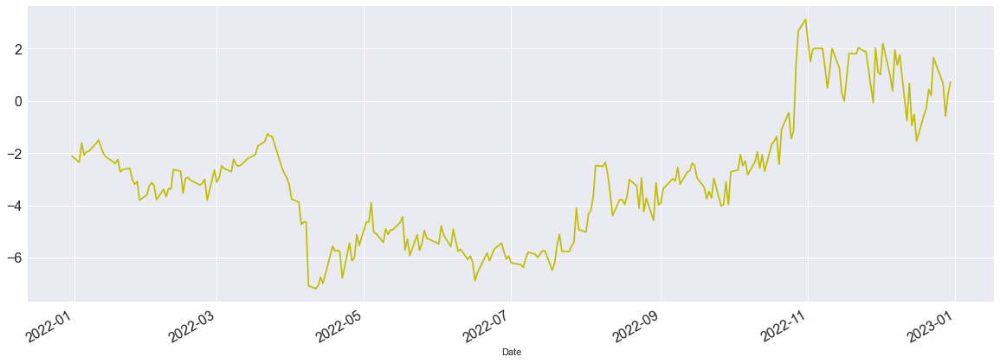

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
2021-12-31 -2.180000 -2.040000 -2.430000 -2.070000  -2.111012   44000
2022-01-03 -1.970000 -2.010000 -2.100000 -2.310000  -2.348413   66900
2022-01-04 -2.030000 -1.550000 -2.000000 -1.560000  -1.609159   36800
2022-01-05 -1.840000 -1.389999 -2.110000 -2.030000  -2.073034   81600
2022-01-06 -1.929999 -1.790000 -2.050000 -1.900000  -1.945111   33400
...              ...       ...       ...       ...        ...     ...
2022-12-23 -0.790001  0.449997  0.299999  1.670000   1.670000   54200
2022-12-27  1.889999  0.980000  1.080002  0.650002   0.650002   33900
2022-12-28  0.480001  0.250000  0.240000 -0.580002  -0.580002   31800
2022-12-29 -0.349998  0.510002 -0.349998  0.250000   0.250000   50600
2022-12-30  0.090000  0.870003 -0.169998  0.730000   0.730000   56700

[252 rows x 6 columns]








Urstadt Biddle Properties Inc.
[*********************100%*

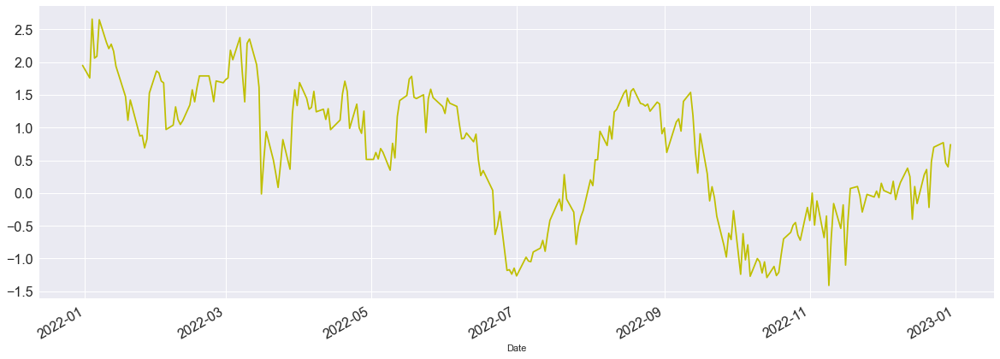

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
2021-12-31  2.500000  1.630001  2.439999  2.139999   1.948570   89300
2022-01-03  1.960001  1.799999  2.170000  1.940001   1.757629  230300
2022-01-04  2.440001  2.219999  2.740000  2.850000   2.655523  291300
2022-01-05  1.860001  2.050001  2.400002  2.230000   2.060236  164600
2022-01-06  2.280001  2.309999  2.500000  2.260000   2.087835  100000
...              ...       ...       ...       ...        ...     ...
2022-12-23  0.440001  0.490000  0.510000  0.699999   0.699999   55500
2022-12-27  0.910000  0.910000  0.670000  0.769999   0.769999   63300
2022-12-28  0.779999  0.750000  0.429998  0.459999   0.459999   94600
2022-12-29  0.330002  0.400000  0.180000  0.400000   0.400000   56200
2022-12-30  0.800001  0.400000  0.650002  0.740002   0.740002   90500

[252 rows x 6 columns]








Urban One, Inc.
[*********************100%****************

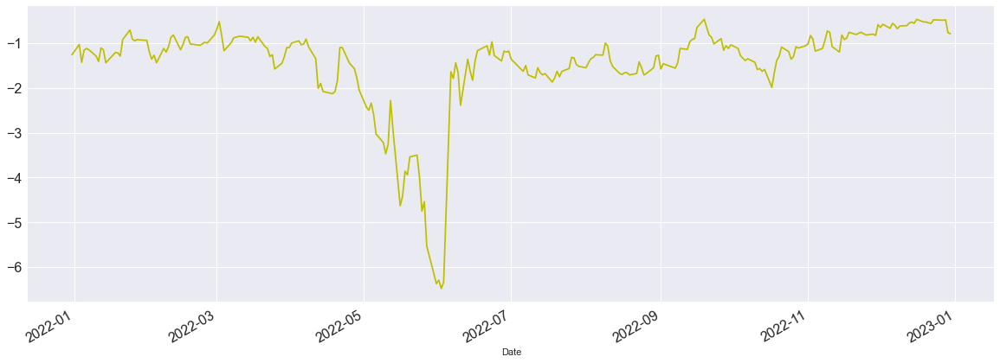

            Open  High   Low  Close  Adj Close  Volume
Date                                                  
2021-12-31 -1.32 -1.38 -1.25  -1.26      -1.26  612900
2022-01-03 -1.12 -0.96 -1.13  -1.03      -1.03   -1700
2022-01-04 -1.01 -1.29 -1.26  -1.43      -1.43  -37600
2022-01-05 -1.24 -1.51 -1.18  -1.16      -1.16 -314600
2022-01-06 -1.15 -1.09 -1.01  -1.12      -1.12 -170900
...          ...   ...   ...    ...        ...     ...
2022-12-23 -0.63 -0.52 -0.51  -0.48      -0.48  -12500
2022-12-27 -0.51 -0.50 -0.44  -0.49      -0.49  -22500
2022-12-28 -0.45 -0.49 -0.41  -0.48      -0.48    -800
2022-12-29 -0.51 -0.51 -0.70  -0.77      -0.77   88200
2022-12-30 -0.81 -0.71 -0.81  -0.79      -0.79   46900

[252 rows x 6 columns]








Biglari Holdings Inc.
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


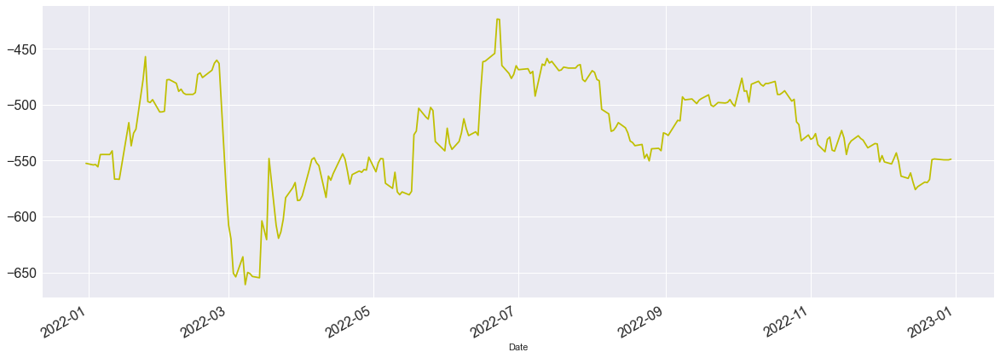

                  Open        High         Low       Close   Adj Close  Volume
Date                                                                          
2021-12-31 -562.490021 -569.520020 -553.000000 -552.429993 -552.429993    5649
2022-01-03 -550.160004 -550.160004 -554.750000 -553.830002 -553.830002    2300
2022-01-04 -554.669998 -550.619995 -554.669998 -553.509995 -553.509995    2000
2022-01-05 -551.190002 -551.190002 -556.089996 -555.539993 -555.539993    4500
2022-01-06 -544.259995 -551.999878 -544.789993 -544.589996 -544.589996    2351
...                ...         ...         ...         ...         ...     ...
2022-12-23 -549.229980 -547.519989 -550.049988 -548.509995 -548.509995     500
2022-12-27 -548.059998 -548.059998 -550.089996 -549.309998 -549.309998     959
2022-12-28 -549.759995 -548.059998 -550.250000 -549.300003 -549.300003     676
2022-12-29 -558.139984 -557.669983 -549.740005 -549.330002 -549.330002     545
2022-12-30 -549.000000 -548.500000 -549.639999 -548.

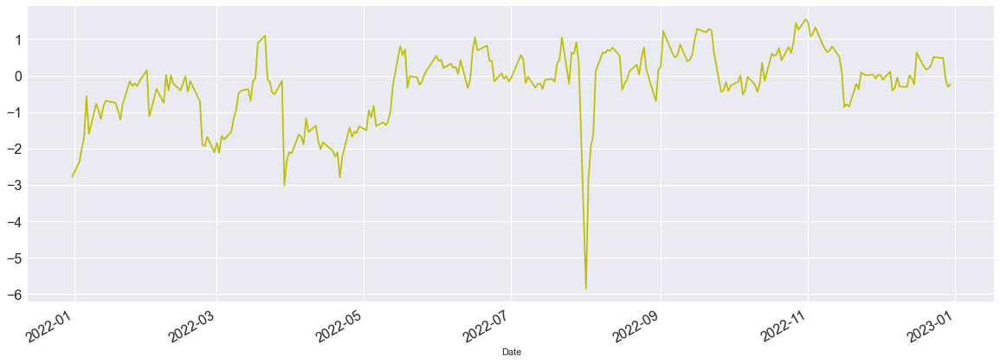

                Open   High       Low  Close  Adj Close  Volume
Date                                                           
2021-12-31 -3.089000 -2.910 -2.834000 -2.980  -2.783982    6100
2022-01-03 -2.530001 -2.960 -2.740000 -2.544  -2.376371   10900
2022-01-04 -2.500000 -2.180 -2.040000 -2.150  -2.008007   33500
2022-01-05 -2.389999 -2.240 -1.814000 -1.820  -1.699549   15600
2022-01-06 -1.220000 -0.640 -0.672999 -0.600  -0.559044   41600
...              ...    ...       ...    ...        ...     ...
2022-12-23  0.600000  0.721  0.490000  0.510   0.510000   10800
2022-12-27  0.520000  0.525  0.405000  0.480   0.480000    7900
2022-12-28  0.420000  0.490 -0.100000 -0.100  -0.100000   42000
2022-12-29 -0.190000 -0.170 -0.360000 -0.310  -0.310000   20800
2022-12-30 -0.360000 -0.160 -0.460000 -0.243  -0.243000   15100

[252 rows x 6 columns]








Tidewater Inc New ([Wts/Rts])
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- TDW-WS-A: No ti

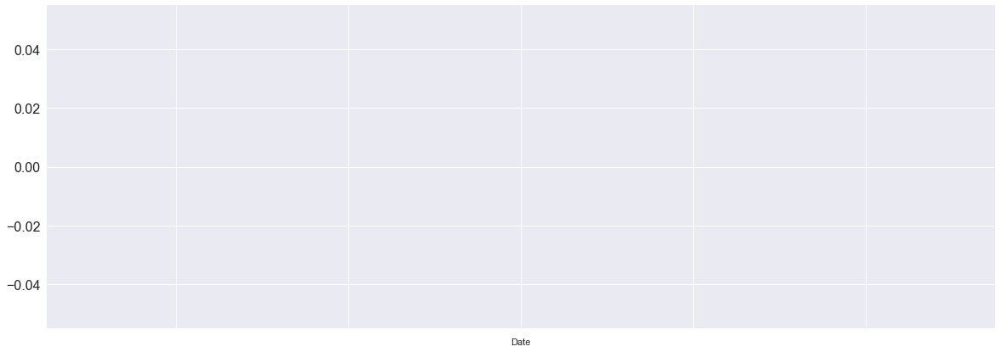

Empty DataFrame
Columns: [Open, High, Low, Close, Adj Close, Volume]
Index: []










In [1008]:
#Create YTD Premium Movement charts/market-summaries for all dual-class shares in the VTI Index
for i in dual_class_pairs:
    print(i)
    ytd_premium_movement(dual_class_pairs[i][0], dual_class_pairs[i][1])
    print('\n\n\n\n\n\n\n')

# Observations

As we can see, twenty out of the twenty-one dual share companies within the VTI index have graph visualizations and market summaries available. Therefore we may be able to employ the arbitrage strategy with 95.2% of our stocks - which may not be bad necessarily. The company that did not make the cut was Tidewater Inc as it was found that Tidewater Common Stocks were to be purchased in early 2023 thereby pushing the company out of dual-class categorization.

Let's go ahead and drop that from our research.

In [1009]:
del dual_class_pairs['Tidewater Inc New ([Wts/Rts])']

# Retrieving Key Parameters for Neural Network Processing

In [1010]:
import seaborn as sns
import statsmodels.api as sm
from scipy import stats

In [1011]:
main = ['BRK-A']
alt = ['BRK-B']

In [1012]:
#Using the create_input_layer method above, we may obtain an input layer which can be processed through our perceptron

#Example on Berkshire Hathway's dual-shares
input_layer(main, alt)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[219924611682.90326, -227.36019493190443, 486309.0862502399]

As we can see, the values of RSS, slope, and intercept are outrageous. This is because the differences in the prices of class shares is very large - the reason being Berkshire Hathaway's decision on not choosing to split their class's price. We may proceed with others.

# Pre-Processing the Data

In [1013]:
import keras
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import random, os

First to store each input layer in a dictionary.

In [1014]:
input_layers = {}
for i in dual_class_pairs:
    input_layers[i] = [input_layer(dual_class_pairs[i][0],dual_class_pairs[i][1])]

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [1015]:
#The Dictionary
input_layers

{'Alphabet Inc.': [[25.707293957717123,
   -0.001837241985766805,
   -0.20037048270916416]],
 'Berkshire Hathaway Inc.': [[219924611682.90326,
   227.36019493190443,
   -486309.0862502399]],
 'Brown-Forman Corporation': [[177.41373676464715,
   -0.02744764106939727,
   5.66312306695679]],
 'Lennar Corporation': [[1082.503308974704,
   0.005949837782253343,
   13.957143470524356]],
 'HEICO Corporation': [[859.764246651553,
   -0.053062535685091616,
   -21.582852047729297]],
 'Liberty Broadband Corporation': [[496.94621530667945,
   -0.01940440626064595,
   4.406284386603535]],
 'Fox Corporation': [[19.16467786756413,
   -0.007057369676386607,
   3.497893130661844]],
 'News Corporation': [[2.3182142693609027,
   -0.00021847492663096027,
   -0.22719864118607047]],
 'Zillow Group, Inc.': [[72.43870564809379,
   -0.003774441255501251,
   0.9249422419317261]],
 'Clearway Energy, Inc.': [[23.21111780593174,
   -0.0008480407092552631,
   2.7734174818142687]],
 'Greif, Inc.': [[1183.61425190026

These values gathered each have a particular function - the first value in the input layer conveys a quantitative measure for the volatility of a particular premium, while the other two values convey a quantitative measure regarding market sentiment surrounding emphasis on voter rights vs. liquidity.

With these values we may be able to train a perceptron on dates ranging from 10 months before the official end of the housing-market bubble pop induced recession to end of the recession, with exact measures approximately between August 2008 and June 2009.

# Configure Output Layer 

We will obtain input layers from only the companies that existed during 2008 era and for trendlines covering the 2008-2009 timespan.

In [1016]:
relevant_dual_class_pairs = dual_class_pairs
print(relevant_dual_class_pairs)
del relevant_dual_class_pairs['Liberty Broadband Corporation']

{'Alphabet Inc.': [['GOOGL'], ['GOOG']], 'Berkshire Hathaway Inc.': [['BRK-B'], ['BRK-A']], 'Brown-Forman Corporation': [['BF-B'], ['BF-A']], 'Lennar Corporation': [['LEN'], ['LEN-B']], 'HEICO Corporation': [['HEI-A'], ['HEI']], 'Liberty Broadband Corporation': [['LBRDK'], ['LBRDA']], 'Fox Corporation': [['FOXA'], ['FOX']], 'News Corporation': [['NWSA'], ['NWS']], 'Zillow Group, Inc.': [['Z'], ['ZG']], 'Clearway Energy, Inc.': [['CWEN'], ['CWEN-A']], 'Greif, Inc.': [['GEF'], ['GEF-B']], 'Under Armour, Inc.': [['UA'], ['UAA']], 'Central Garden & Pet Company': [['CENTA'], ['CENT']], 'Federal Agricultural Mortgage Corporation': [['AGM'], ['AGM-A']], 'Lions Gate Entertainment Corp.': [['LGF-B'], ['LGF-A']], 'Bel Fuse Inc.': [['BELFB'], ['BELFA']], 'Urstadt Biddle Properties Inc.': [['UBA'], ['UBP']], 'Urban One, Inc.': [['UONEK'], ['UONE']], 'Biglari Holdings Inc.': [['BH'], ['BH-A']], 'FAT Brands Inc.': [['FAT'], ['FATBB']]}


In [1017]:
del relevant_dual_class_pairs['Fox Corporation']

In [1018]:
del relevant_dual_class_pairs['News Corporation']

In [1019]:
del relevant_dual_class_pairs['Zillow Group, Inc.']

In [1020]:
del relevant_dual_class_pairs['Clearway Energy, Inc.']

In [1021]:
del relevant_dual_class_pairs['Under Armour, Inc.']

In [1022]:
del relevant_dual_class_pairs['Lions Gate Entertainment Corp.']

In [1023]:
del relevant_dual_class_pairs['Biglari Holdings Inc.']

In [1024]:
del relevant_dual_class_pairs['FAT Brands Inc.']

In [1025]:
del relevant_dual_class_pairs['Berkshire Hathaway Inc.']

In [1026]:
start_date = '2008-08-01' 
end_date = '2009-06-01'

Alphabet Inc.
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


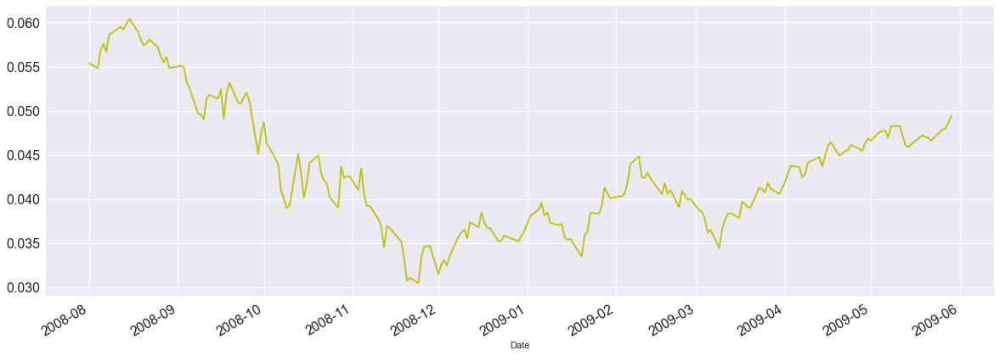

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
2008-08-01  0.055938  0.056021  0.054750  0.055387   0.055387 -571290
2008-08-04  0.055417  0.055995  0.054680  0.054811   0.054811 -472355
2008-08-05  0.055353  0.056832  0.055205  0.056805   0.056805 -680803
2008-08-06  0.056630  0.057980  0.055938  0.057574   0.057574 -641165
2008-08-07  0.057060  0.057296  0.056397  0.056719   0.056719 -526827
...              ...       ...       ...       ...        ...     ...
2009-05-22  0.046957  0.047192  0.046406  0.046583   0.046583 -326413
2009-05-26  0.046400  0.047944  0.046169  0.047869   0.047869 -589637
2009-05-27  0.048019  0.048757  0.047922  0.048011   0.048011 -576304
2009-05-28  0.048380  0.048728  0.047897  0.048583   0.048583 -506885
2009-05-29  0.048785  0.049392  0.048618  0.049392   0.049392 -502972

[208 rows x 6 columns]








Brown-Forman Corporation
[*********************100%*******

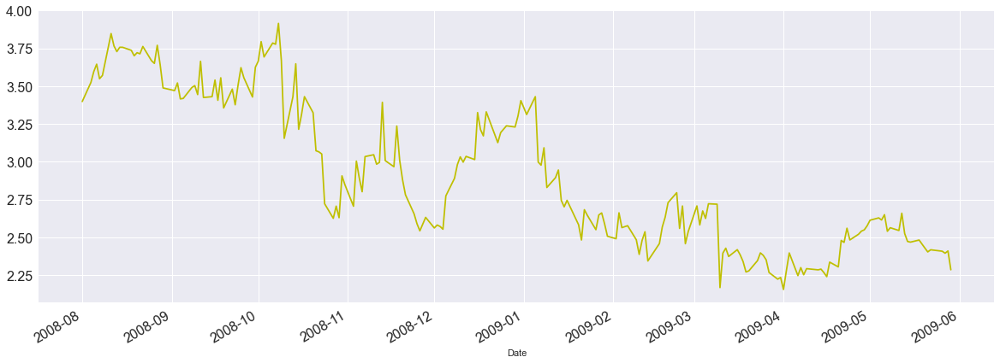

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2008-08-01  3.874496  3.880897  3.763614  3.723488   3.398237  1056531
2008-08-04  3.680821  3.862424  3.809873  3.891211   3.524142   790495
2008-08-05  3.724973  3.965637  3.724973  3.965637   3.596297  1657214
2008-08-06  3.939147  4.036579  3.873309  4.021646   3.645300   797613
2008-08-07  4.108569  4.073735  3.857726  3.913760   3.548988  1152299
...              ...       ...       ...       ...        ...      ...
2009-05-22  2.454702  2.526299  2.454702  2.512863   2.417548  1065025
2009-05-26  2.361438  2.562993  2.373553  2.485288   2.408196  1788838
2009-05-27  2.510400  2.647785  2.509993  2.484170   2.394803  2102554
2009-05-28  2.561571  2.596238  2.464455  2.504119   2.409849  1966881
2009-05-29  2.550634  2.581051  2.403358  2.351038   2.285369  5371894

[208 rows x 6 columns]








Lennar Corporation
[*********************100%

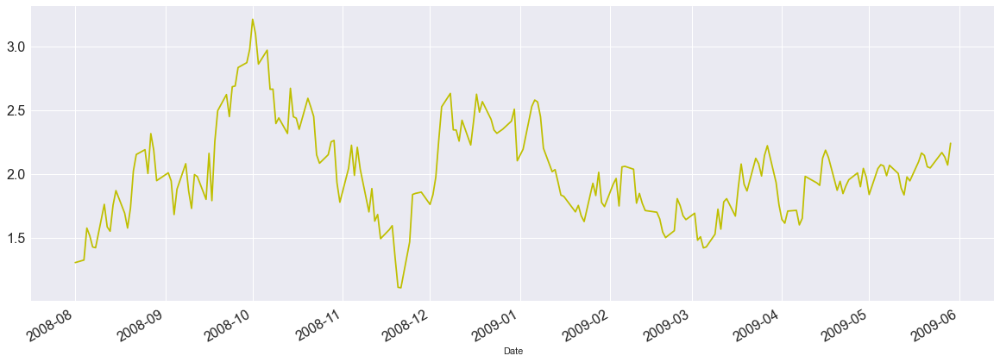

                Open      High       Low     Close  Adj Close    Volume
Date                                                                   
2008-08-01  1.309156  1.211840  1.003297  1.171525   1.304964   6151356
2008-08-04  1.161374  1.249985  1.061745  1.200300   1.324862   5627316
2008-08-05  1.181155  1.467407  1.288739  1.467147   1.575514   6166368
2008-08-06  1.466538  1.350569  1.338192  1.389641   1.515432   4908769
2008-08-07  1.526028  1.449910  1.260282  1.300191   1.427327   7894883
...              ...       ...       ...       ...        ...       ...
2009-05-22  2.105791  2.135636  2.006768  2.086095   2.046806   4479795
2009-05-26  2.046561  2.234513  1.997340  2.214500   2.167676   4766763
2009-05-27  2.263492  2.314043  2.164237  2.183961   2.132564   6562796
2009-05-28  2.213749  2.194430  1.985539  2.123778   2.069465  10464363
2009-05-29  2.123893  2.213892  2.114061  2.302012   2.240346   8417384

[208 rows x 6 columns]








HEICO Corporation
[*************

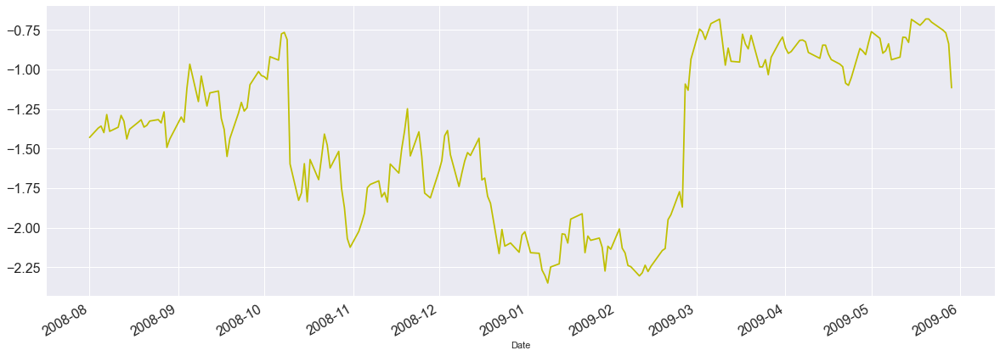

                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2008-08-01 -1.379926 -1.459618 -1.348469 -1.421869  -1.429890  -367642
2008-08-04 -1.449132 -1.415578 -1.392509 -1.356857  -1.371068  -576019
2008-08-05 -1.468006 -1.367343 -1.386217 -1.337983  -1.357848  -680924
2008-08-06 -1.363149 -1.413481 -1.333789 -1.384120  -1.399331  -549317
2008-08-07 -1.390412 -1.390412 -1.256194 -1.264583  -1.285222  -422954
...              ...       ...       ...       ...        ...      ...
2009-05-22 -0.601883 -0.675283 -0.650118 -0.641728  -0.701545  -442028
2009-05-26 -0.650117 -0.696254 -0.744489 -0.687865  -0.752174  -446320
2009-05-27 -0.677380 -0.736101 -0.664797 -0.708838  -0.769945  -472546
2009-05-28 -0.557843 -0.824180 -0.631243 -0.780140  -0.839202 -2231121
2009-05-29 -0.864027 -0.912261 -0.861929 -1.075839  -1.116402 -1600742

[208 rows x 6 columns]








Greif, Inc.
[*********************100%*******

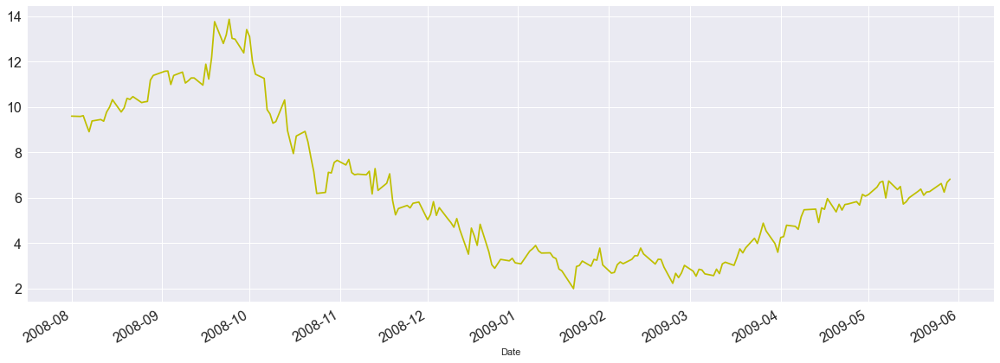

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
2008-08-01  6.020000  7.500000  6.000000  6.599998   9.600107  219500
2008-08-04  7.750000  7.750000  6.110001  6.799999   9.586540  130800
2008-08-05  8.310001  8.150002  7.510002  6.990002   9.619808  209400
2008-08-06  6.360001  6.950001  6.700001  6.239998   9.250025  140100
2008-08-07  6.970001  6.710003  6.529999  5.830002   8.910480  195100
...              ...       ...       ...       ...        ...     ...
2009-05-22  3.770000  3.889999  3.279999  3.419998   6.267679  328400
2009-05-26  3.009998  4.160000  2.990002  3.799999   6.627371  322900
2009-05-27  3.920002  4.439999  3.320000  3.430000   6.244732  388100
2009-05-28  4.540001  3.869999  3.730003  3.860001   6.676952  637500
2009-05-29  3.919998  4.430000  3.549999  3.889999   6.818367  349900

[208 rows x 6 columns]








Central Garden & Pet Company
[*********************100%***

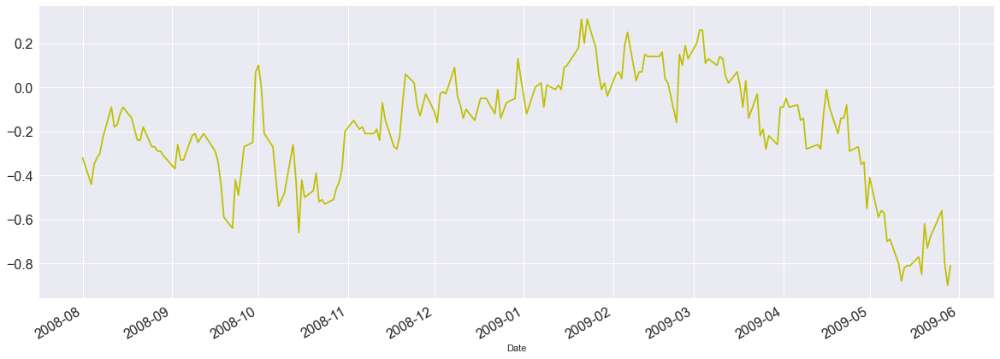

                Open  High   Low     Close  Adj Close  Volume
Date                                                         
2008-08-01 -0.340000 -0.43 -0.43 -0.320000  -0.320000   56800
2008-08-04 -0.350000 -0.38 -0.41 -0.440000  -0.440000  142800
2008-08-05 -0.520000 -0.50 -0.45 -0.350000  -0.350000  331200
2008-08-06 -0.380000 -0.44 -0.47 -0.320000  -0.320000  156800
2008-08-07 -0.280000 -0.32 -0.48 -0.300000  -0.300000 -193700
...              ...   ...   ...       ...        ...     ...
2009-05-22 -0.719999 -0.88 -0.77 -0.680000  -0.680000  162400
2009-05-26 -0.790000 -0.52 -0.67 -0.560000  -0.560000  188300
2009-05-27 -0.560000 -0.73 -0.75 -0.800000  -0.800000  144100
2009-05-28 -1.000000 -0.90 -0.73 -0.900001  -0.900001 -148100
2009-05-29 -0.970000 -0.88 -0.97 -0.809999  -0.809999  203800

[208 rows x 6 columns]








Federal Agricultural Mortgage Corporation
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************] 

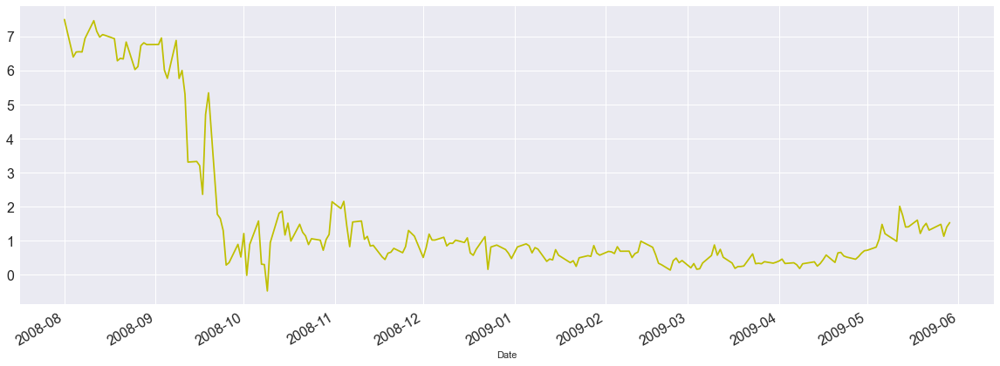

                Open       High       Low      Close  Adj Close  Volume
Date                                                                   
2008-08-01  9.660000  10.230000  8.680000  10.199999   7.503186   29100
2008-08-04  9.939999   8.900000  8.699999   8.480000   6.400122   40700
2008-08-05  8.719999   8.730000  8.170000   8.699999   6.547764   38900
2008-08-06  8.480000   8.750000  8.230000   8.709999   6.554480   27000
2008-08-07  8.760000   9.190001  8.190001   8.709999   6.548674   34800
...              ...        ...       ...        ...        ...     ...
2009-05-22  2.010000   1.950000  1.740000   1.700000   1.310585  474400
2009-05-26  1.460000   2.160000  1.350000   1.940000   1.482305  336400
2009-05-27  2.000000   2.030000  1.290000   1.440000   1.130703  322300
2009-05-28  1.750000   1.850000  1.850000   1.820000   1.402938  444600
2009-05-29  2.160000   2.240000  1.880000   2.000000   1.531879  429600

[208 rows x 6 columns]








Bel Fuse Inc.
[*****************

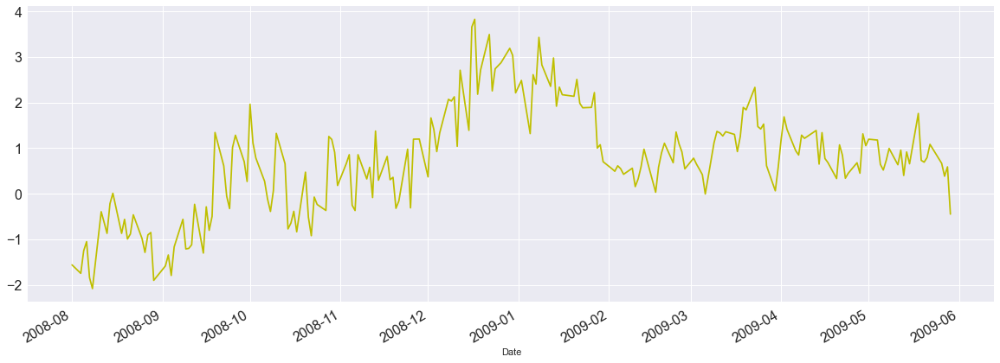

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
2008-08-01 -1.790001 -0.360001 -1.330000 -1.270000  -1.560980   36900
2008-08-04 -0.530001 -0.449999 -1.650000 -1.520000  -1.746788   57300
2008-08-05 -1.260000 -0.410000 -2.330000 -0.889999  -1.251337   33800
2008-08-06 -1.010000 -0.350000 -1.710001 -0.639999  -1.050907   28400
2008-08-07 -1.500000 -1.240000 -1.820000 -1.619999  -1.840446   19800
...              ...       ...       ...       ...        ...     ...
2009-05-22  1.430000  1.470000  1.599999  1.599999   1.085205   28100
2009-05-26  1.230000  1.340000  0.970000  1.100000   0.668530  112100
2009-05-27  0.590000  1.090000  0.599999  0.759999   0.385331   82600
2009-05-28  0.960000  1.290000  0.960000  1.009999   0.590550   39000
2009-05-29  0.880000 -0.120000  1.250000 -0.240000  -0.446933   39000

[208 rows x 6 columns]








Urstadt Biddle Properties Inc.
[*********************100%*

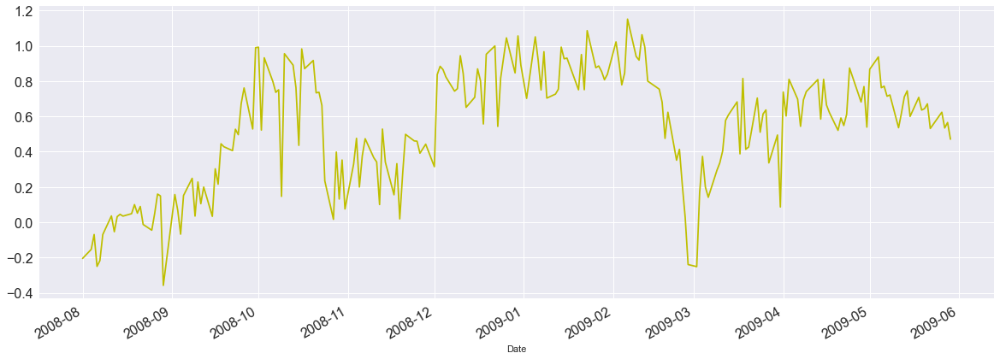

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
2008-08-01 -0.740002 -0.599998 -0.049999 -0.639999  -0.204813   36200
2008-08-04 -0.120001 -0.490002 -0.350000 -0.530001  -0.153355   49100
2008-08-05 -0.020000 -0.309999 -0.059999 -0.359999  -0.069140   58400
2008-08-06 -0.359999 -0.519999 -0.350000 -0.740000  -0.250094   55500
2008-08-07 -0.660000 -0.709999 -0.670000 -0.670000  -0.217583   39300
...              ...       ...       ...       ...        ...     ...
2009-05-22  1.410000  1.490000  0.990000  0.910000   0.531590  160000
2009-05-26  0.540000  1.120000  0.720000  1.090000   0.623942  114700
2009-05-27  1.259999  1.259999  0.900001  0.920000   0.534567   55400
2009-05-28  1.110000  0.770000  0.850000  0.980000   0.565752   87500
2009-05-29  0.940000  0.780000  0.840000  0.780000   0.470978  147900

[208 rows x 6 columns]








Urban One, Inc.
[*********************100%****************

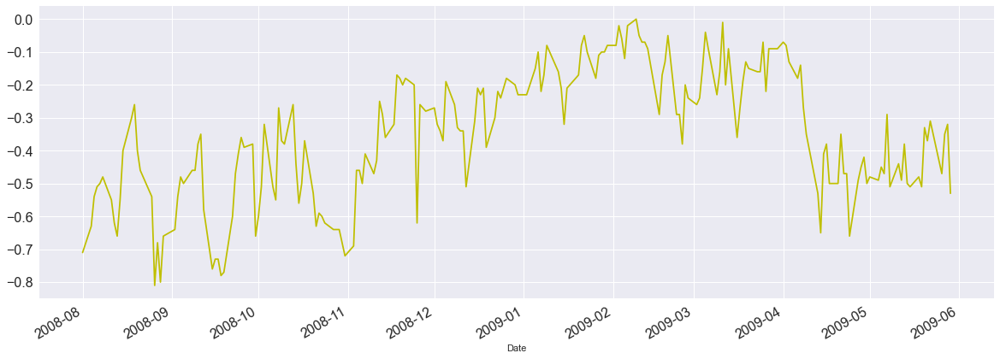

            Open  High   Low  Close  Adj Close   Volume
Date                                                   
2008-08-01 -0.81 -0.80 -0.68  -0.71      -0.71    95600
2008-08-04 -1.53 -1.47 -0.52  -0.63      -0.63   151800
2008-08-05 -0.55 -0.89 -0.50  -0.54      -0.54   164100
2008-08-06 -0.56 -0.55 -0.58  -0.51      -0.51  1161600
2008-08-07 -0.52 -0.53 -0.52  -0.50      -0.50   184400
...          ...   ...   ...    ...        ...      ...
2009-05-22 -0.36 -0.30 -0.36  -0.31      -0.31    19600
2009-05-26 -0.38 -0.47 -0.39  -0.47      -0.47    23100
2009-05-27 -0.35 -0.45 -0.38  -0.35      -0.35    26600
2009-05-28 -0.38 -0.34 -0.34  -0.32      -0.32    26700
2009-05-29 -0.44 -0.44 -0.34  -0.53      -0.53     8100

[208 rows x 6 columns]










In [1027]:
for i in relevant_dual_class_pairs:
    print(i)
    gen_ytd_premium_movement(dual_class_pairs[i][0], dual_class_pairs[i][1], start_date, end_date )
    print('\n\n\n\n\n\n\n')

In [1028]:
relevant_dual_class_pairs

{'Alphabet Inc.': [['GOOGL'], ['GOOG']],
 'Brown-Forman Corporation': [['BF-B'], ['BF-A']],
 'Lennar Corporation': [['LEN'], ['LEN-B']],
 'HEICO Corporation': [['HEI-A'], ['HEI']],
 'Greif, Inc.': [['GEF'], ['GEF-B']],
 'Central Garden & Pet Company': [['CENTA'], ['CENT']],
 'Federal Agricultural Mortgage Corporation': [['AGM'], ['AGM-A']],
 'Bel Fuse Inc.': [['BELFB'], ['BELFA']],
 'Urstadt Biddle Properties Inc.': [['UBA'], ['UBP']],
 'Urban One, Inc.': [['UONEK'], ['UONE']]}

In [1029]:
len(relevant_dual_class_pairs)

10

Now to create input layer from the 2008-2009 trendline for relevant dual-class stocks

In [1030]:
full = {}
for i in dual_class_pairs:
    full[i] = [gen_input_layer(dual_class_pairs[i][0],dual_class_pairs[i][1], start_date, end_date)]

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [1031]:
full

{'Alphabet Inc.': [[0.008935382317552032,
   -4.171188635884433e-05,
   0.047635855352698674]],
 'Brown-Forman Corporation': [[11.943521126802862,
   -0.007039735457860204,
   3.638087325162818]],
 'Lennar Corporation': [[28.068202378573623,
   -0.0009869133031389851,
   2.1124080838220793]],
 'HEICO Corporation': [[46.32792973188991,
   0.0025159664276852805,
   -1.665113957447298]],
 'Greif, Inc.': [[1050.5469049883793,
   -0.03504242536836251,
   9.986342030717552]],
 'Central Garden & Pet Company': [[14.173804047588028,
   -0.00014022702064939735,
   -0.17803461215142433]],
 'Federal Agricultural Mortgage Corporation': [[520.9944292140235,
   -0.02277218483752344,
   4.038562729417247]],
 'Bel Fuse Inc.': [[216.26457952454382,
   0.009102282764126056,
   -0.2355096000803717]],
 'Urstadt Biddle Properties Inc.': [[18.602797927583914,
   0.0024770288058845176,
   0.2779426668161496]],
 'Urban One, Inc.': [[6.587108577641607,
   0.001395754282579964,
   -0.4980663358873829]]}

As seen above, our model hopes to retrieve stocks that rebounded back to a positive premium at the end of the recession at a ten-month timespan. Essentially, if the premium trendline of the dual-class stocks is positive at the end we will count that output as the binary 1 and vice-versa.

Based on the 2008-2009 trendlines, we observe that we can form output layers for each of the 10 layers:
[1],
[1],
[1],
[0],
[1],
[0],
[1],
[0],
[1],
[0]

In [1032]:
#Create Full Input-Output Layer Format
for i in relevant_dual_class_pairs:
    one = relevant_dual_class_pairs[i][0]
    two = relevant_dual_class_pairs[i][1]
    final = get_Adj_close_premium(one, two, start_date, end_date)
    if final <= 0:
        full[i].append(0)
    else:
        full[i].append(1)
    #input_layers[i].append()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [1033]:
full

{'Alphabet Inc.': [[0.008935382317552032,
   -4.171188635884433e-05,
   0.047635855352698674],
  1],
 'Brown-Forman Corporation': [[11.943521126802862,
   -0.007039735457860204,
   3.638087325162818],
  1],
 'Lennar Corporation': [[28.068202378573623,
   -0.0009869133031389851,
   2.1124080838220793],
  1],
 'HEICO Corporation': [[46.32792973188991,
   0.0025159664276852805,
   -1.665113957447298],
  0],
 'Greif, Inc.': [[1050.5469049883793, -0.03504242536836251, 9.986342030717552],
  1],
 'Central Garden & Pet Company': [[14.173804047588028,
   -0.00014022702064939735,
   -0.17803461215142433],
  0],
 'Federal Agricultural Mortgage Corporation': [[520.9944292140235,
   -0.02277218483752344,
   4.038562729417247],
  1],
 'Bel Fuse Inc.': [[216.26457952454382,
   0.009102282764126056,
   -0.2355096000803717],
  0],
 'Urstadt Biddle Properties Inc.': [[18.602797927583914,
   0.0024770288058845176,
   0.2779426668161496],
  1],
 'Urban One, Inc.': [[6.587108577641607,
   0.001395754282579

In [1042]:
#Create Buckets
X = []
y = []
for i in relevant_dual_class_pairs:
    X.append(full[i][0])
    y.append(full[i][1])
    
#Convert to NumPy Arrays
X = np.array(X)
y = np.array(y)

In [1043]:
print(X)

[[ 8.93538232e-03 -4.17118864e-05  4.76358554e-02]
 [ 1.19435211e+01 -7.03973546e-03  3.63808733e+00]
 [ 2.80682024e+01 -9.86913303e-04  2.11240808e+00]
 [ 4.63279297e+01  2.51596643e-03 -1.66511396e+00]
 [ 1.05054690e+03 -3.50424254e-02  9.98634203e+00]
 [ 1.41738040e+01 -1.40227021e-04 -1.78034612e-01]
 [ 5.20994429e+02 -2.27721848e-02  4.03856273e+00]
 [ 2.16264580e+02  9.10228276e-03 -2.35509600e-01]
 [ 1.86027979e+01  2.47702881e-03  2.77942667e-01]
 [ 6.58710858e+00  1.39575428e-03 -4.98066336e-01]]


# Perceptron Building

This is a relatively basic neural network composed of three input nodes with dual output nodes each covering a hit or miss (0 or 1 binary response as to whether or not 1: Use Dual-Class Strategy or 0: Do Not Use Dual-Class Strategy

In [1044]:
from sklearn.linear_model import Perceptron
from sklearn.model_selection import train_test_split

In [1061]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Perceptron

# Load the data
'''X = np.array([[ 8.93538232e-03, -4.17118864e-05,  4.76358554e-02],
              [ 1.19435211e+01, -7.03973546e-03,  3.63808733e+00],
              [ 2.80682024e+01, -9.86913303e-04,  2.11240808e+00],
              [ 4.63279297e+01,  2.51596643e-03, -1.66511396e+00],
              [ 1.05054690e+03, -3.50424254e-02,  9.98634203e+00],
              [ 1.41738040e+01, -1.40227021e-04, -1.78034612e-01],
              [ 5.20994429e+02, -2.27721848e-02,  4.03856273e+00],
              [ 2.16264580e+02,  9.10228276e-03, -2.35509600e-01],
              [ 1.86027979e+01,  2.47702881e-03,  2.77942667e-01],
              [ 6.58710858e+00,  1.39575428e-03, -4.98066336e-01]])
y = np.array([0, 0, 1, 1, 1, 0, 1, 0, 0, 0])
'''
# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

# Create the model
model = Perceptron()

# Train the model on the training data
model.fit(X_train, y_train)

# Test the model on the test data
accuracy = model.score(X_test, y_test)
print("Accuracy: {:.2f}".format(accuracy))

Accuracy: 0.67


As we can see, the model accuracy changes as many times as we run it due to stochasticity of the training process. Additionally, there may be some issues regarding the size of the training-testing set as only 10 samples were used to train this perceptron. However, we may now proceed with the current model to predict the outputs for the current dual-class stocks.

In [1070]:
input_layers

{'Alphabet Inc.': [[25.707293957717123,
   -0.001837241985766805,
   -0.20037048270916416]],
 'Berkshire Hathaway Inc.': [[219924611682.90326,
   227.36019493190443,
   -486309.0862502399]],
 'Brown-Forman Corporation': [[177.41373676464715,
   -0.02744764106939727,
   5.66312306695679]],
 'Lennar Corporation': [[1082.503308974704,
   0.005949837782253343,
   13.957143470524356]],
 'HEICO Corporation': [[859.764246651553,
   -0.053062535685091616,
   -21.582852047729297]],
 'Liberty Broadband Corporation': [[496.94621530667945,
   -0.01940440626064595,
   4.406284386603535]],
 'Fox Corporation': [[19.16467786756413,
   -0.007057369676386607,
   3.497893130661844]],
 'News Corporation': [[2.3182142693609027,
   -0.00021847492663096027,
   -0.22719864118607047]],
 'Zillow Group, Inc.': [[72.43870564809379,
   -0.003774441255501251,
   0.9249422419317261]],
 'Clearway Energy, Inc.': [[23.21111780593174,
   -0.0008480407092552631,
   2.7734174818142687]],
 'Greif, Inc.': [[1183.61425190026

In [1080]:
# Test the model on a new real inputs
for i in input_layers:
    x_new = np.array(input_layers[i])
    prediction = model.predict(x_new)
    if prediction == [0]:
        print(f"Do not run strategy on {i}")
    else:
        print(f"Run strategy on {i}")

Run strategy on Alphabet Inc.
Run strategy on Berkshire Hathaway Inc.
Run strategy on Brown-Forman Corporation
Run strategy on Lennar Corporation
Run strategy on HEICO Corporation
Run strategy on Liberty Broadband Corporation
Run strategy on Fox Corporation
Run strategy on News Corporation
Run strategy on Zillow Group, Inc.
Run strategy on Clearway Energy, Inc.
Run strategy on Greif, Inc.
Run strategy on Under Armour, Inc.
Run strategy on Central Garden & Pet Company
Run strategy on Federal Agricultural Mortgage Corporation
Run strategy on Lions Gate Entertainment Corp.
Run strategy on Bel Fuse Inc.
Run strategy on Urstadt Biddle Properties Inc.
Run strategy on Urban One, Inc.
Run strategy on Biglari Holdings Inc.
Run strategy on FAT Brands Inc.


# 

Therefore, based on a model trained on past recession-data, we may be able to proceed with the strategy in all dual-class shares shown above.



This concludes the project.

# Final Words

We observe that the final recommendations seem very unlikely to actually seem like they could work as running the strategy on all stocks would be interesting. A few future recommendations in further versions: 

1) Change the input layer to focus away from linear trendline as we cannot predict the direction of the line. However, maybe focusing on the residuals alone may help.

2) Adjust the training set timespan to better realize predictions.